# Question No. 2: (Feature Extraction and Classical Regression)

#### For the following questions, use only T3 type of cells as the output prediction variable.

#### i. Extract features from a given image. Specifically, calculate the:

#### a. average of the “H”, red, green and blue channels

#### b. variance of the “H”, red, green and blue channels

#### c. entropy of the “H”, red, green and blue channels

#### d. Any other features that you think can be useful for this work. Describe your reasoning for using these features.

#### Plot the scatter plot and calculate the correlation coefficient of each feature in Q(2i,a-c) you obtain vs. the target variable (cell count) across all images. Which features do you think are important? Give your reasoning.

#### Features

In [6]:
from skimage import color
from skimage.measure import shannon_entropy
from PIL import Image

In [7]:
# def image_saver(img):
#     img = np.asarray(im*255).astype('float32')
#     PIL_Image = Image.fromarray(img)
#     if PIL_Image.mode != 'RGB':
#         PIL_Image = PIL_Image.convert('RGB')
#     PIL_Image.save('images/deez.jpeg')

In [8]:
def image_list_channeler(img_list,channel):
    channeled_image_list = []
    for im in img_list:
        channeled_image_list.append(image_channeler(im,channel))
    return np.array(channeled_image_list)

In [9]:
def image_channeler(image,channel,dtype=float):
    if channel == None:
        return image
    null = np.zeros_like(image[:, :, 0])
    im_hed = rgb2hed(image)
    if channel == 'h':
        image = im_hed[:,:,0]
    elif channel == 'e':
        image = im_hed[:,:,1]
    elif channel == 'd':
        image = im_hed[:,:,2]
    elif channel == 'gr':
        image = color.rgb2gray(im)
    elif channel == 'r':
        image = image[:,:,0]
    elif channel == 'g':
        image = image[:,:,1]
    elif channel == 'b':
        image = image[:,:,2]
    else:
        print('ERROR: Channel does not exist')
        return None
    if dtype == float:
        return image
    else:
        return (255*image).astype(dtype)

In [10]:
def feature_extract(image,feature,channel):
    im = image_channeler(image,channel)
    return feature(im)

In [11]:
def scatter_inputs(image_list,channel,cell_type,feature,num_images=100,mode='separate'):
    x = []
    for im in image_list[:num_images]:
        x.append(feature_extract(im,feature,channel))
    y = Y[cell_type][:num_images]
    return np.array(x),np.array(y)
#     plt.scatter(x,y)
#     plt.xlabel(feature.__name__+str(' of the ')+str(channel)+str(' channel'))
#     plt.ylabel(cell_type+' count')

In [12]:
def scatter_plotter(image_list,Yfold,channel,cell_type,feature,num_images=100,mode='separate'):
    x = []
    for im in image_list[:num_images]:
        x.append(feature_extract(im,feature,channel))
    y = Yfold[cell_type][:num_images]
    plt.scatter(x,y)
    plt.xlabel(feature.__name__+str(' of the ')+str(channel)+str(' channel'))
    plt.ylabel(cell_type+' count')
    return x,y

In [13]:
def feature_plotter(images,fold = Yfold1,xlabelstr = ''):
    fig = plt.figure(figsize=(18,6))
    results_dic = {}
    i=1
    num_images = None

    for feature in features:
        plt.subplot(1,len(features),i)
        x = []
        for im in images:
            x.append(feature(im))
        y = fold['lymphocyte']
    #     print(len(x),len(y))
        plt.scatter(x,y)
        plt.xlabel(str(feature.__name__)+str(xlabelstr))
        plt.ylabel('lymphocyte count')
        plt.title('Coeff: '+str(np.corrcoef(x,y)[0,1]))
        results_dic[str(feature.__name__)] = np.corrcoef(x,y)[0,1]#

        i+=1
    return results_dic

In [14]:
# fold_num = 0
# for fold in [Xfold1,Xfold2,Xfold3]:
#     fold_num += 1
#     for channel in ['h','e','d']:
#         channeled_images = image_list_channeler(fold,channel)
#         np.save('data/images/'+str(channel)+'fold'+str(fold_num)+'.npy',channeled_images)

In [15]:
features = [np.var,np.std,np.mean,shannon_entropy,np.max]
channels = ['h','e','d','gr','r','g','b']

In [33]:
# num_images = 10
# # fig, axs = plt.subplots(len(features),len(channels))
# fig = plt.figure(figsize=(18,30))
# results_dic = {}
# i=1
# for channel in channels:
#     for feature in features:
#         plt.subplot(len(channels),len(features),i)
#         x,y = scatter_plotter(Xfold1,Yfold1,channel,'lymphocyte',feature,num_images=num_images)
#         results_dic[str(channel)+','+str(feature.__name__)] = np.corrcoef(x,y)[0,1]#
        
#         i+=1

In [34]:
# results_dic

In [14]:
r_folds = input_image_fold_designator(X[:,:,:,0],return_param=0)
g_folds = input_image_fold_designator(X[:,:,:,1],return_param=0)
b_folds = input_image_fold_designator(X[:,:,:,2],return_param=0)

{'var': 0.43930548767583616,
 'std': 0.4464213396356337,
 'mean': -0.400264286417796,
 'shannon_entropy': 0.3404576111750108,
 'amax': 0.02695118277660994}

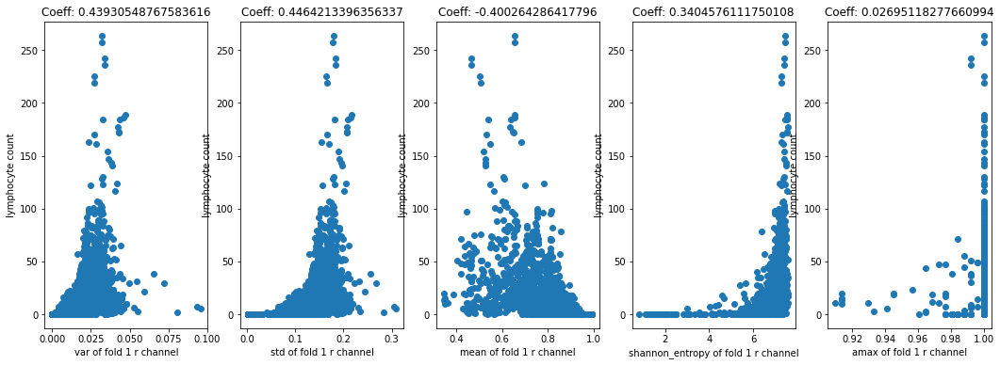

In [36]:
feature_plotter(r_folds[0],fold = Yfold1, xlabelstr=' of fold 1 r channel')

{'var': 0.1458180326867103,
 'std': 0.18441146433671202,
 'mean': -0.4479125711631828,
 'shannon_entropy': 0.2437916319542139,
 'amax': -0.3242833399739893}

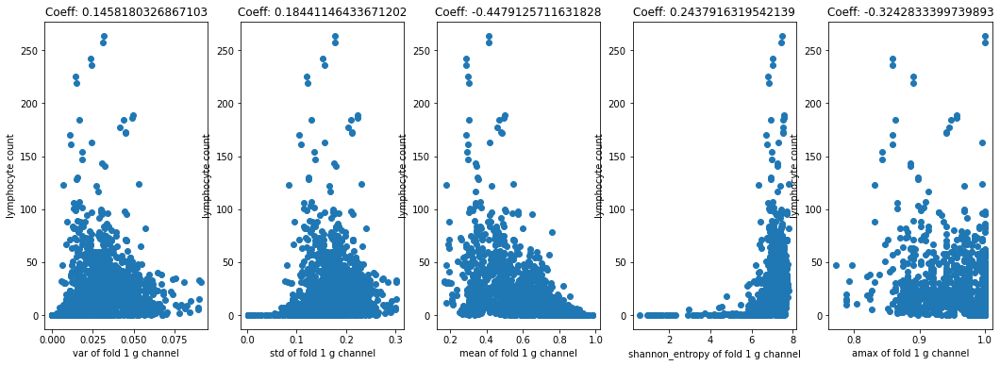

In [37]:
feature_plotter(g_folds[0],fold = Yfold1, xlabelstr=' of fold 1 g channel')

{'var': 0.24711487066318907,
 'std': 0.3175032217270504,
 'mean': -0.4067679033256346,
 'shannon_entropy': 0.31710020912141307,
 'amax': 0.03784030834446055}

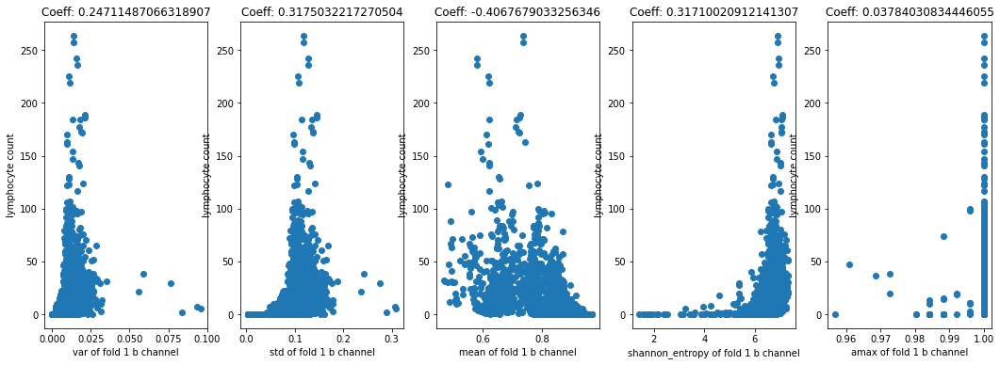

In [38]:
feature_plotter(b_folds[0],fold = Yfold1, xlabelstr=' of fold 1 b channel')

In [39]:
# # scatter_plotter(hfold1,Yfold1,channel,'lymphocyte',feature,num_images=100,mode='separate')
# hfold1 = np.load('data/images/hfold1.npy')
# fig = plt.figure(figsize=(18,6))
# results_dic = {}
# i=1
# num_images = None

# for feature in features:
#     plt.subplot(1,len(features),i)
#     x = []
#     for im in hfold1:
#         x.append(feature(im))
#     y = Yfold1['lymphocyte'][:num_images]
# #     print(len(x),len(y))
#     plt.scatter(x,y)
#     plt.xlabel(feature.__name__+str('of H channel'))
#     plt.ylabel('lymphocyte count')
#     plt.title('Coeff: '+str(np.corrcoef(x,y)[0,1]))
#     results_dic[str(feature.__name__)] = np.corrcoef(x,y)[0,1]#

#     i+=1

{'var': 0.5059295962096414,
 'std': 0.5182413168373621,
 'mean': 0.37758024100725773,
 'shannon_entropy': 0.22878874030414928,
 'amax': 0.1942356506608959}

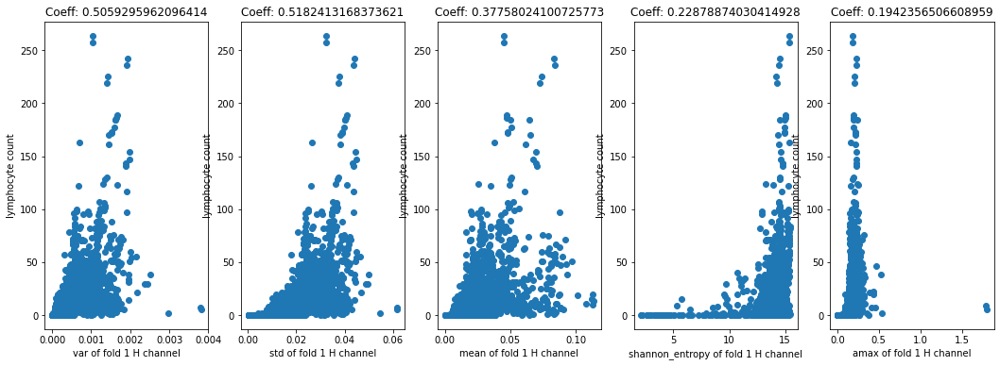

In [41]:
feature_plotter(np.load('data/images/hfold1.npy'), fold = Yfold1, xlabelstr=' of fold 1 H channel')

{'var': 0.17618211558294744,
 'std': 0.2819944317908257,
 'mean': 0.38534455850141053,
 'shannon_entropy': 0.26614162850613227,
 'amax': 0.18333772448239685}

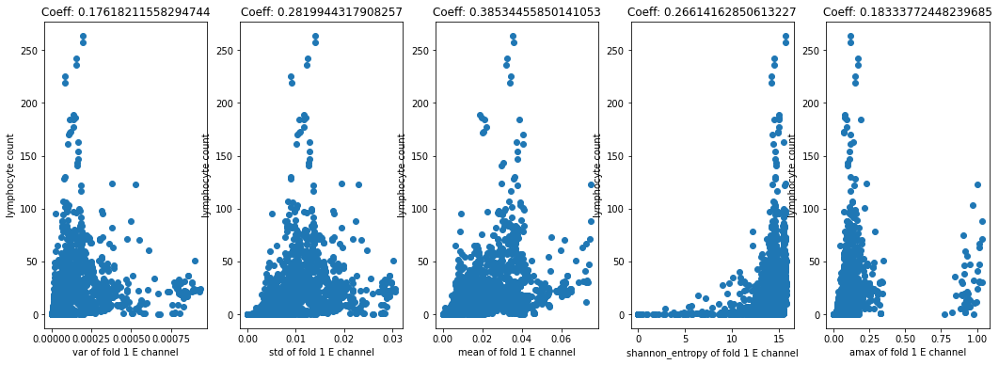

In [42]:
feature_plotter(np.load('data/images/efold1.npy'),fold = Yfold1, xlabelstr=' of fold 1 E channel')

{'var': 0.0681357058125895,
 'std': 0.2320587758678041,
 'mean': 0.31172391684157363,
 'shannon_entropy': 0.22408564212992255,
 'amax': 0.05138996662192897}

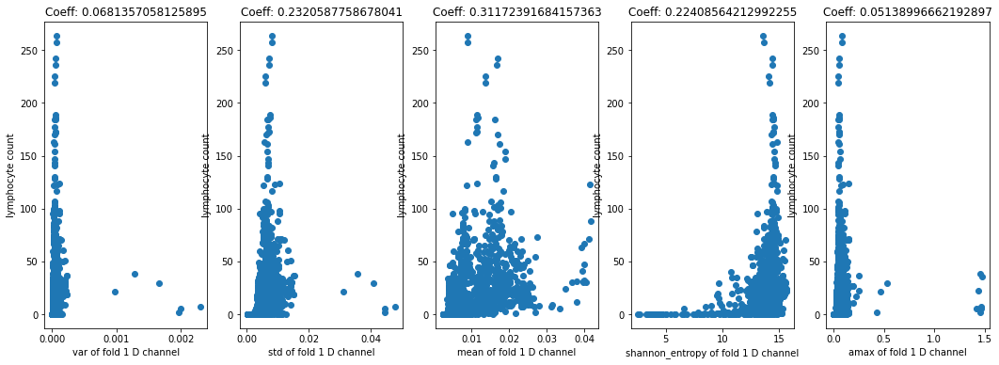

In [43]:
feature_plotter(np.load('data/images/dfold1.npy'),fold=Yfold1, xlabelstr=' of fold 1 D channel')

All of these features (var, std, mean, entropy and max) of the h,e,d,r,g,b channels give low correlation coefficients so are not very important for the regression task.

#### GLCM features

In [44]:
from skimage.feature import greycomatrix, greycoprops

this code was taken from https://github.com/tzm030329/GLCM/blob/master/fast_glcm.py as it promised a faster way to compute GLCM features. generation of glcm images was performed using this code.

I chose to consider this feature as it was recommended on the assignment sheet.

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import data

def glcm_init(img):
    return (255*color.rgb2gray(img)).astype('int')


def new_fast_glcm(img_list, vmin=0, vmax=255, nbit=8, kernel_size=5):
    glcm_images = []
    for img in img_list:
        mi, ma = vmin, vmax
        ks = kernel_size
        
        h,w = img[:,:,0].shape

        # digitize
        bins = np.linspace(mi, ma+1, nbit+1)
        gl1 = np.digitize(img, bins) - 1
        gl2 = np.append(gl1[:,1:], gl1[:,-1:], axis=1)

        # make glcm
        glcm = np.zeros((nbit, nbit, h, w), dtype=np.uint8)
        for i in range(nbit):
            for j in range(nbit):
                mask = ((gl1==i) & (gl2==j))
                glcm[i,j, mask] = 1

        kernel = np.ones((ks, ks), dtype=np.uint8)
        for i in range(nbit):
            for j in range(nbit):
                glcm[i,j] = cv2.filter2D(glcm[i,j], -1, kernel)

        glcm = glcm.astype(np.float32)
        glcm_images.append(glcm)
    return glcm_images


def fast_glcm(img, vmin=0, vmax=255, nbit=8, kernel_size=5):
    mi, ma = vmin, vmax
    ks = kernel_size
    h,w = img.shape

    # digitize
    bins = np.linspace(mi, ma+1, nbit+1)
    gl1 = np.digitize(img, bins) - 1
    gl2 = np.append(gl1[:,1:], gl1[:,-1:], axis=1)

    # make glcm
    glcm = np.zeros((nbit, nbit, h, w), dtype=np.uint8)
    for i in range(nbit):
        for j in range(nbit):
            mask = ((gl1==i) & (gl2==j))
            glcm[i,j, mask] = 1

    kernel = np.ones((ks, ks), dtype=np.uint8)
    for i in range(nbit):
        for j in range(nbit):
            glcm[i,j] = cv2.filter2D(glcm[i,j], -1, kernel)

    glcm = glcm.astype(np.float32)
    return glcm


def fast_glcm_mean(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm mean
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    mean = np.zeros((h,w), dtype=np.float32)
    for i in range(nbit):
        for j in range(nbit):
            mean += glcm[i,j] * i / (nbit)**2

    return mean


def fast_glcm_std(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm std
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    mean = np.zeros((h,w), dtype=np.float32)
    for i in range(nbit):
        for j in range(nbit):
            mean += glcm[i,j] * i / (nbit)**2

    std2 = np.zeros((h,w), dtype=np.float32)
    for i in range(nbit):
        for j in range(nbit):
            std2 += (glcm[i,j] * i - mean)**2

    std = np.sqrt(std2)
    return std


def fast_glcm_contrast(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm contrast
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    cont = np.zeros((h,w), dtype=np.float32)
    for i in range(nbit):
        for j in range(nbit):
            cont += glcm[i,j] * (i-j)**2

    return cont


def fast_glcm_dissimilarity(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm dissimilarity
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    diss = np.zeros((h,w), dtype=np.float32)
    for i in range(nbit):
        for j in range(nbit):
            diss += glcm[i,j] * np.abs(i-j)

    return diss


def fast_glcm_homogeneity(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm homogeneity
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    homo = np.zeros((h,w), dtype=np.float32)
    for i in range(nbit):
        for j in range(nbit):
            homo += glcm[i,j] / (1.+(i-j)**2)

    return homo


def fast_glcm_ASM(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm asm, energy
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    asm = np.zeros((h,w), dtype=np.float32)
    for i in range(nbit):
        for j in range(nbit):
            asm  += glcm[i,j]**2

#     ene = np.sqrt(asm)
    return asm#, ene

def fast_glcm_ene(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm asm, energy
    '''
    h,w = img.shape
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    asm = np.zeros((h,w), dtype=np.float32)
    for i in range(nbit):
        for j in range(nbit):
            asm  += glcm[i,j]**2

    ene = np.sqrt(asm)
    return ene


def fast_glcm_max(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm max
    '''
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    max_  = np.max(glcm, axis=(0,1))
    return max_


def fast_glcm_entropy(img, vmin=0, vmax=255, nbit=8, ks=5):
    img = glcm_init(img)
    '''
    calc glcm entropy
    '''
    glcm = fast_glcm(img, vmin, vmax, nbit, ks)
    pnorm = glcm / np.sum(glcm, axis=(0,1)) + 1./ks**2
    ent  = np.sum(-pnorm * np.log(pnorm), axis=(0,1))
    return ent

In [46]:
glcm_features = [fast_glcm_mean,fast_glcm_std,fast_glcm_contrast,fast_glcm_dissimilarity,fast_glcm_homogeneity,fast_glcm_max,fast_glcm_entropy,fast_glcm_ASM,fast_glcm_ene]   

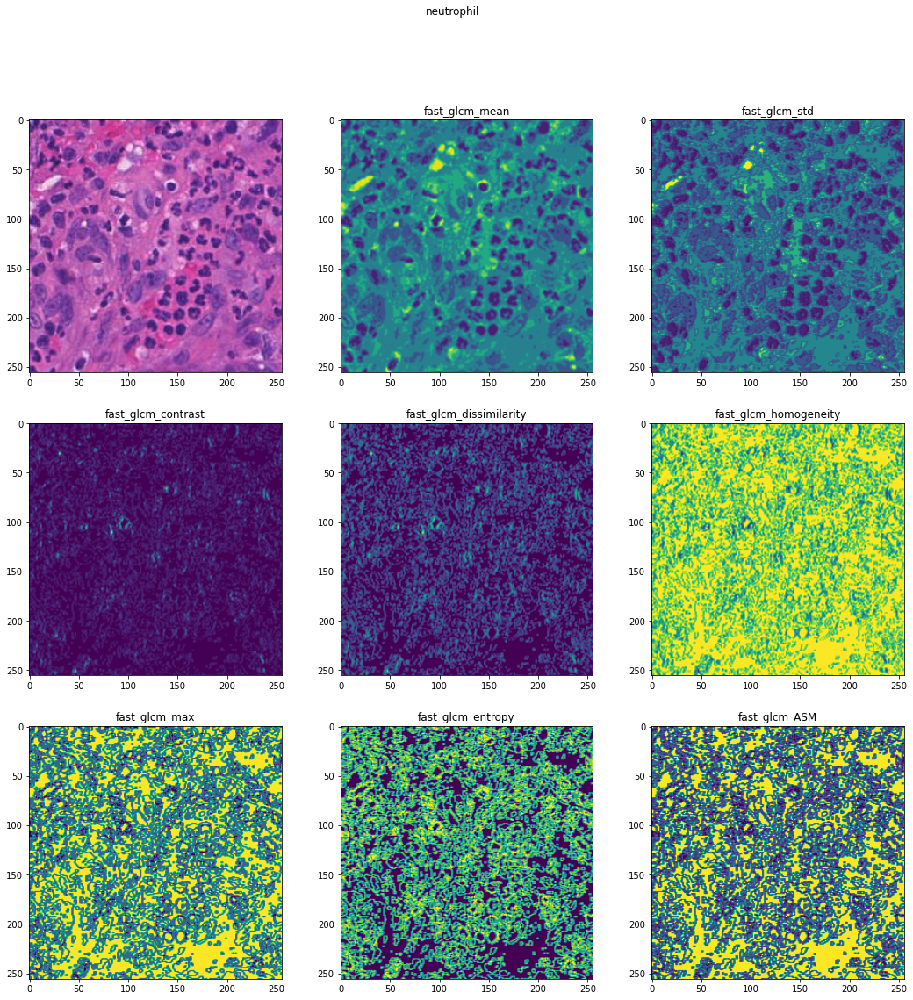

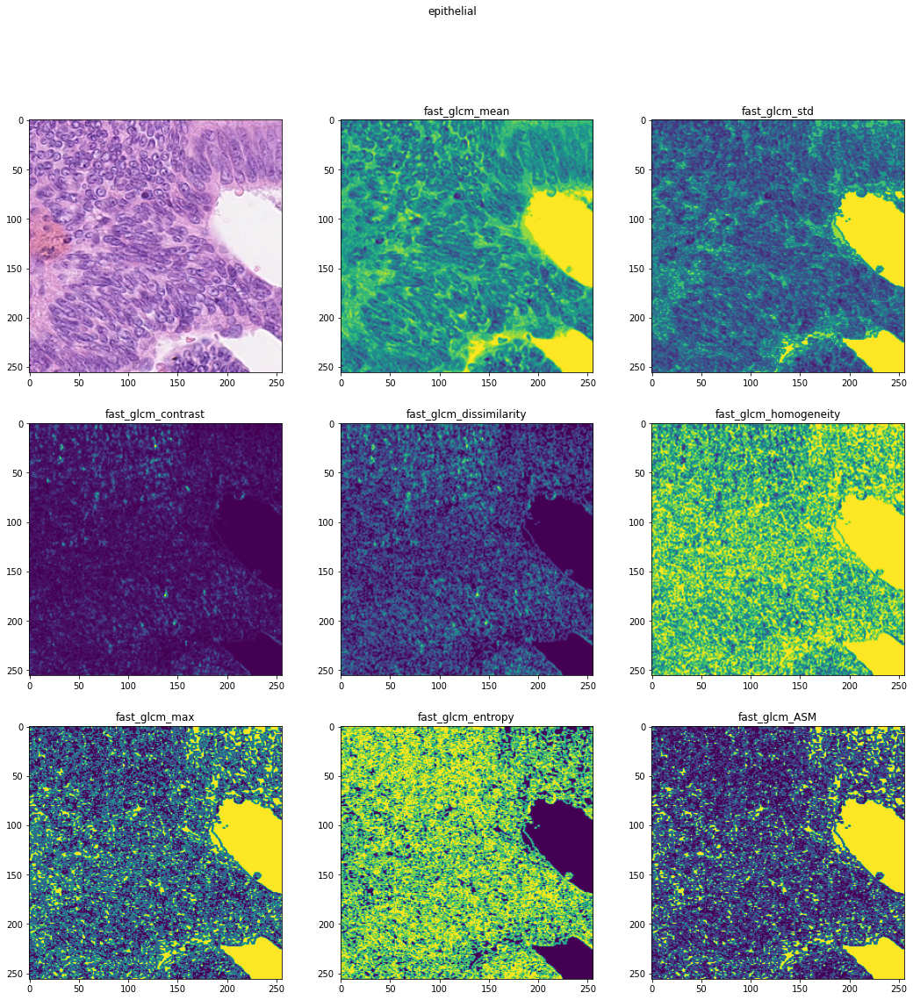

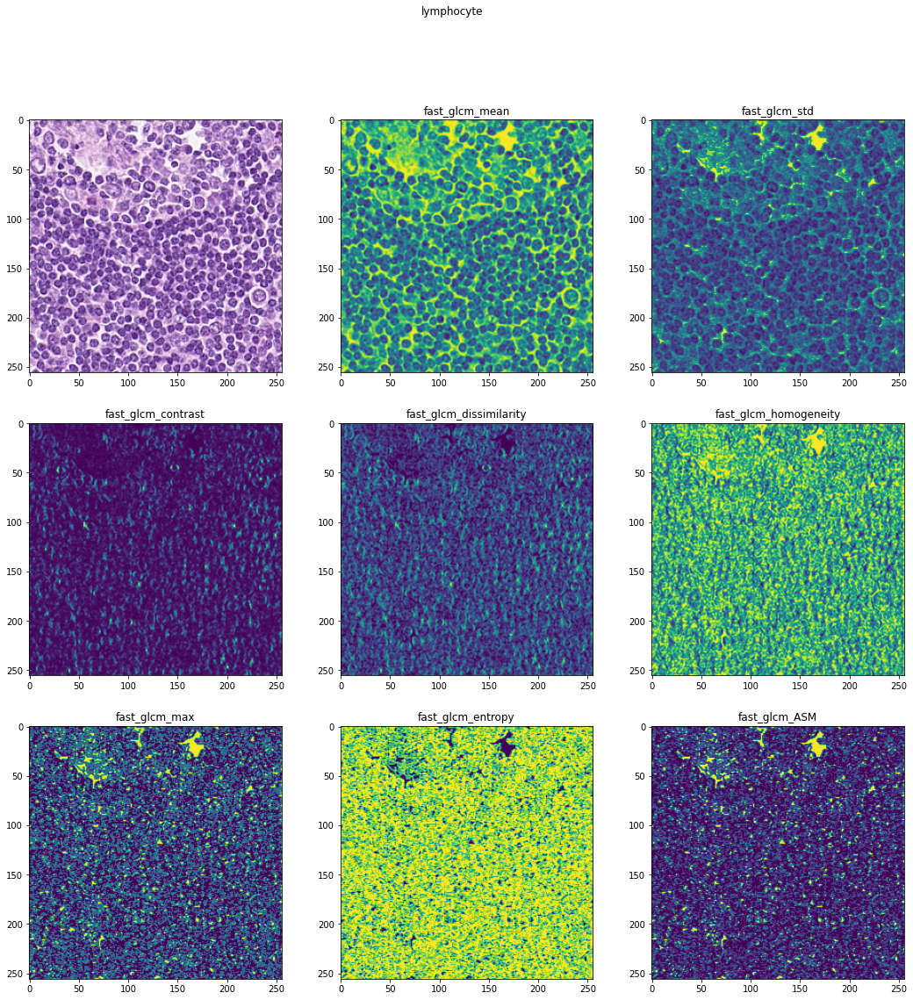

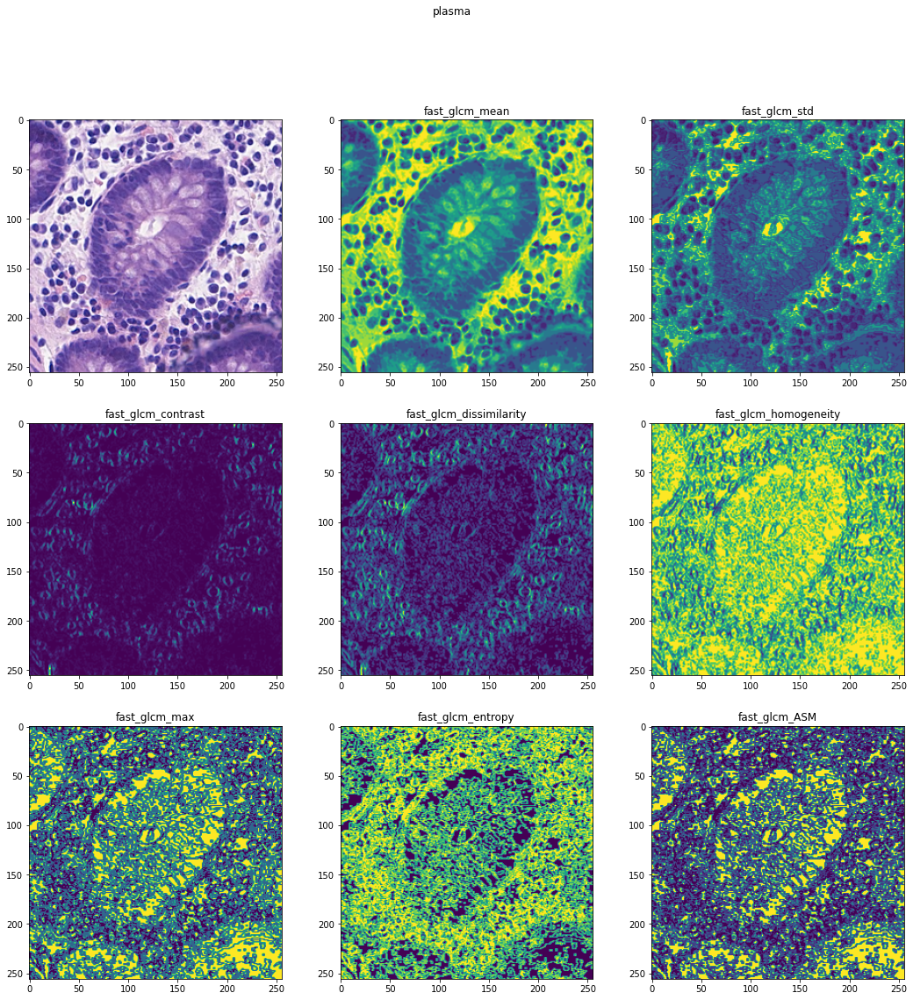

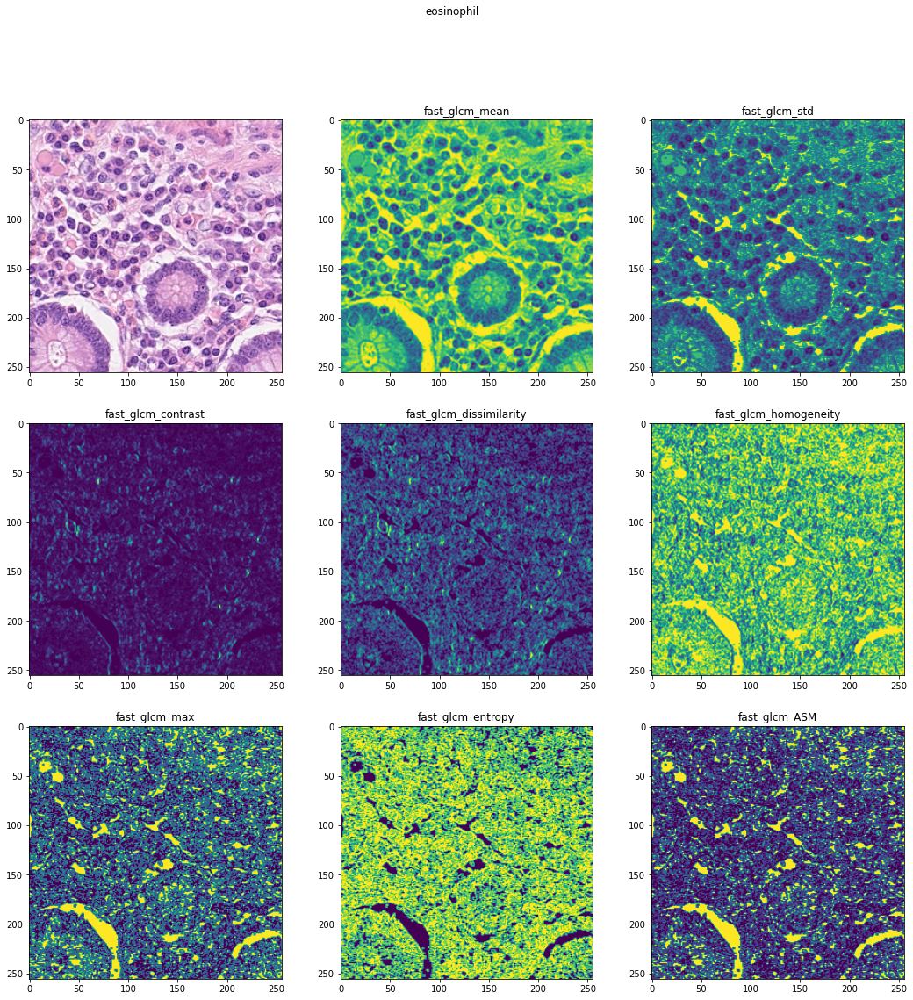

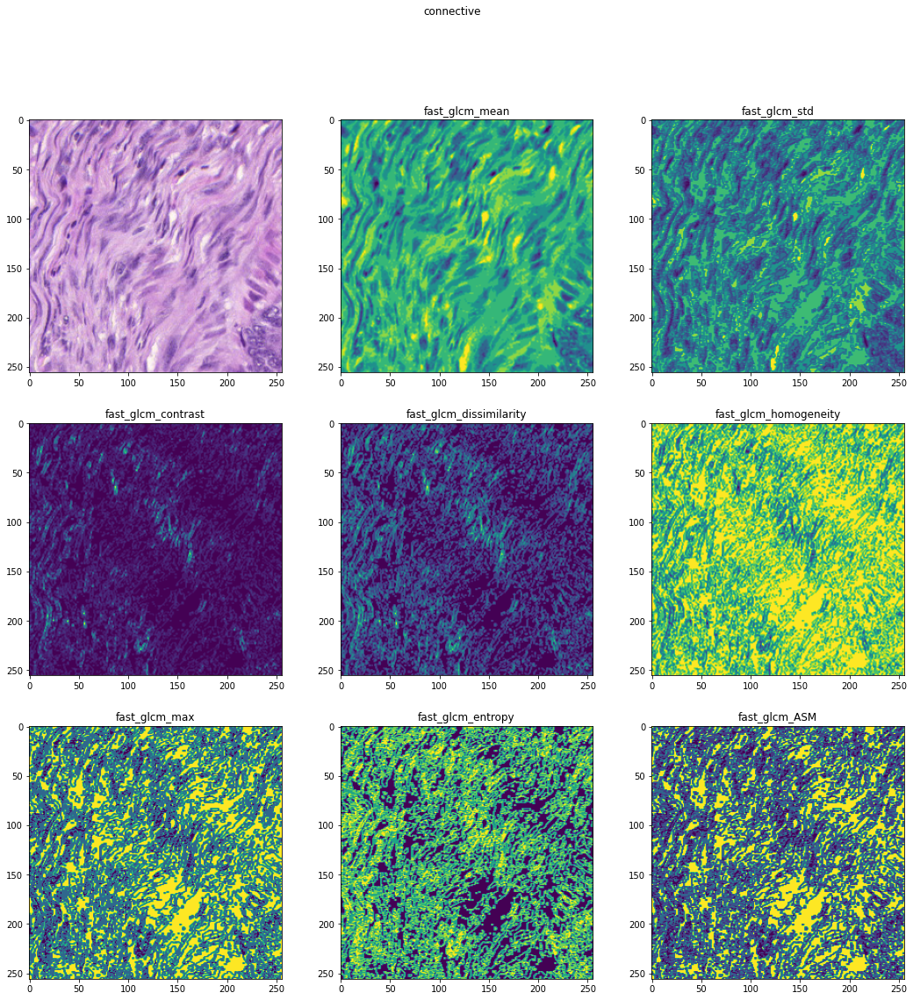

In [48]:
#visualization

for imagekey in extreme_examples_dict:
    image = X[extreme_examples_dict[imagekey]]
    fig = plt.figure(figsize=(18,18))
    plt.subplot(3,3,1)
    plt.imshow(image)
    for i in range(len(glcm_features)-1):
        feature = glcm_features[i]
        plt.subplot(3,3,i+2)
        plt.imshow(feature(image,ks=2))
        plt.title(feature.__name__)
    fig.suptitle(imagekey)
    plt.show()

In [49]:
# glcmFeatureDict = {}
# ks=5

# num_images = 10


# for i in range(len(glcm_features)):
#     feature = glcm_features[i]
#     x = []
#     for img in X[:num_images]:
#         x.append(np.mean(feature(image_channeler(img,'h'),ks=ks)))
#     y = Y['lymphocyte']
# #     print(feature.__name__)
#     glcmFeatureDict[str(feature.__name__)] = x

    
# i = 1
# results_dic = {}
# cell_type = 'lymphocyte'
# fig = plt.figure(figsize=(18,18))
# fig.suptitle('Scatter plots showing the mean value of different images transformed under GLCM with kernel size = '+str(ks))
# for key in glcmFeatureDict.keys():
#     plt.subplot(3,3,i)
#     x = glcmFeatureDict[key]
#     y = Y[cell_type][:num_images]
#     plt.scatter(x,y)
#     plt.xlabel('mean value of '+str(key))
#     plt.ylabel(cell_type+' count')
    
#     results_dic[key] = np.corrcoef(x,y)[0,1]#
    
    
#     i += 1

In [50]:
# print(max(results_dic, key=results_dic.get))
# results_dic[max(results_dic, key=results_dic.get)]

In [51]:
# ks=3
# for feature in glcm_features:
#     im_list = []
#     for im in X:
#         glcm_im = feature(im)
#         im_list.append(glcm_im)
#     np.save('data/images/'+str(feature.__name__)+str(ks)+'.npy',im_list)

In [52]:
# glcm_mean_5 = np.load('data/images/fast_glcm_mean5.npy')

# pca = convert_to_PCA(glcm_mean_5,0.95)

# glcm_mean_5projected = pca.transform(inside_arr_flatten(glcm_mean_5))

In [53]:
# def glcm_plot_scatter_from_saved(images,y = Yfold1['lymphocyte'], num_images = None,cell_type = 'lymphocyte'):
#     i = 1
#     results_dic = {}
# #     fig = plt.figure(figsize=(18,6))
# #     fig.suptitle('Scatter plots showing the mean value of different images transformed under Gabor with kernel size = '+str(31))

#     x=[]
#     for im in images:
#         x.append(np.mean(im))
#     x = np.array(x)
#     y = np.array(y)
# #         print(x.shape,y.shape)
#     plt.scatter(x,y)
# #     plt.xlabel(feature.__name__+' for Gabor gray channel')
# #     plt.ylabel(cell_type+' count')

#     i += 1
#     return np.corrcoef(x,y)[0,1]

In [54]:
# import numpy as np
# import matplotlib.pyplot as plt

# fast_glcm_ene3 = np.load('data/images/fast_glcm_ene3.npy')

# (fast_glcm_ene3fold1,fast_glcm_ene3fold2,fast_glcm_ene3fold3) = input_image_fold_designator(fast_glcm_ene3,return_param = 0)

# glcm_plot_scatter_from_saved(fast_glcm_ene3fold1)

Attempting to put it all together

In [55]:
def glcm_save_data():
    glcm_features_list = ['ene','ASM','entropy','max','homogeneity','dissimilarity','contrast','std','mean']
    glcm_ks_list = ['5']
    i = 1
    results_dic = {}
    for feature in glcm_features_list:
#         fig = plt.figure(figsize=(18,18))
#         fig.suptitle()
        for ks in glcm_ks_list:
#             plt.subplot(3,len(glcm_features_list)/3*len(glcm_ks_list),i)
            file_name = 'data/images/fast_glcm_' + str(feature)+str(ks)+'.npy'
            images = np.load(file_name)
            (fold1,fold2,fold3),(Yfold1,Yfold2,Yfold3) = input_image_fold_designator(images,return_param = 1)
            x=[]
            for im in fold3:
                x.append(np.mean(im))
            x = np.array(x)
            i += 1
            results_dic[file_name] =  x
    return results_dic

In [56]:
# results_dic = glcm_save_data()

# results_dic

# results_dic1 = results_dic.copy()

# for old_key in results_dic.keys():
#     print(old_key)
#     new_key = old_key[12:-4]
#     results_dic1[new_key] = results_dic1[old_key]
#     del results_dic1[old_key]

# results_dic1

# np.save('data/features/glcmdatafold3.npy',results_dic1)

In [57]:
def glcm_data_plotter():
    i = 1
    results_dic = {}
    fig = plt.figure(figsize=(18,18))
    for fold_num in [1]:
        data = np.load('data/features/glcmdatafold'+str(fold_num)+'.npy',allow_pickle=True).item()
        for key in data.keys():
            plt.subplot(3,3,i)
            x  = data[key]
            y = Yfold1['lymphocyte']
            plt.scatter(x,y)
            plt.xlabel(key)
            plt.ylabel('lymphocyte count')
            plt.title('Correlation coefficient: '+"{:.6f}".format(np.corrcoef(x,y)[0,1]))
            i+=1
            results_dic[key] = np.corrcoef(x,y)[0,1]
            
    return results_dic

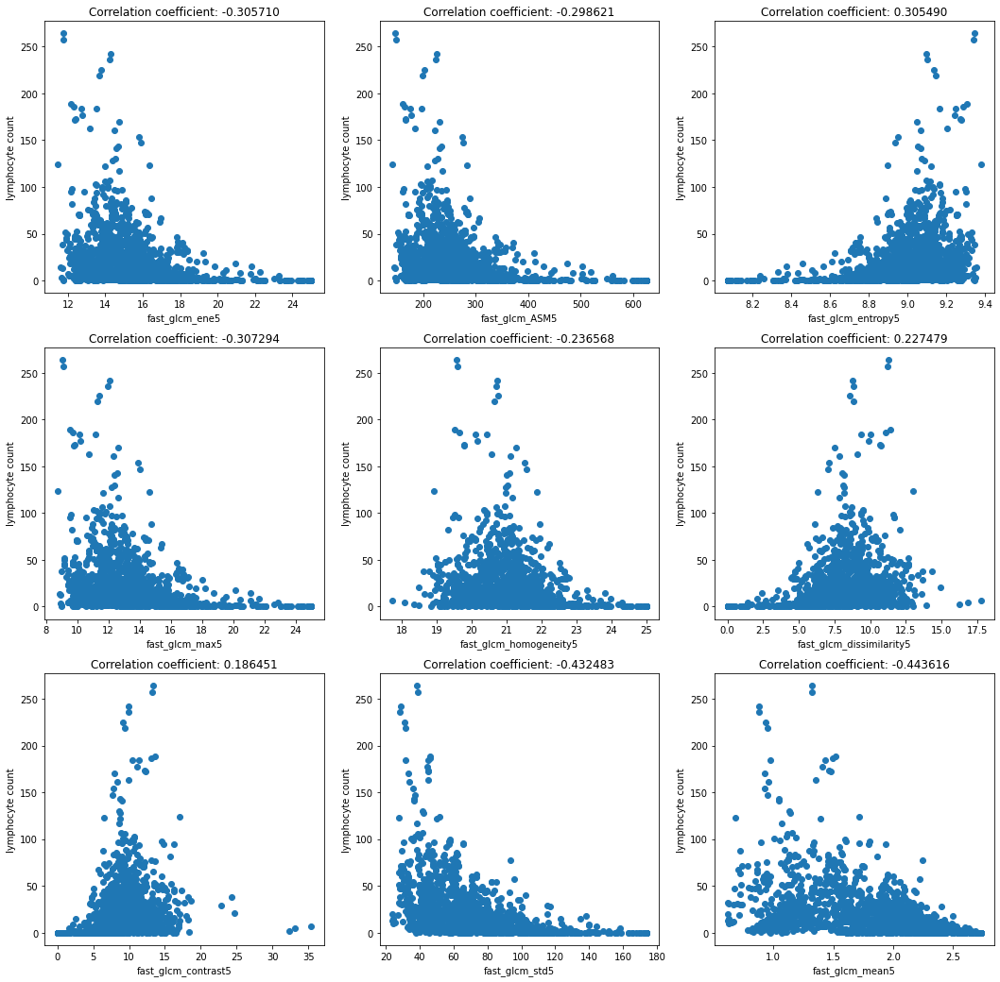

In [58]:
results_dic = glcm_data_plotter()

In [59]:
results_dic

{'fast_glcm_ene5': -0.3057102405866259,
 'fast_glcm_ASM5': -0.29862088571440193,
 'fast_glcm_entropy5': 0.3054898362323949,
 'fast_glcm_max5': -0.3072937970560344,
 'fast_glcm_homogeneity5': -0.2365681999765993,
 'fast_glcm_dissimilarity5': 0.22747910276188033,
 'fast_glcm_contrast5': 0.18645077999165588,
 'fast_glcm_std5': -0.43248336742283516,
 'fast_glcm_mean5': -0.44361589641189614}

Many of the GLCM features give low correlation coefficients so are not very important for the regression task. However, the mean and std of the glcm give the highest correlation coefficient found so far.

#### Gabor filter

In [60]:
from cv2 import getGaborKernel

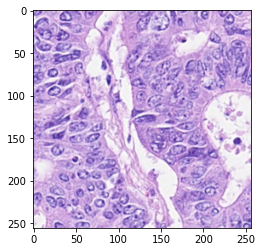

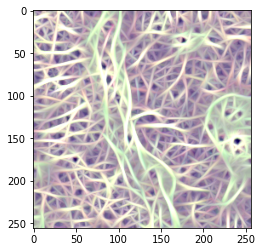

In [61]:
import numpy as np
import cv2
 
def build_filters(ks=31):
    filters = []
    for theta in np.arange(0, np.pi, np.pi / 16):
        kern = cv2.getGaborKernel((ks, ks), 4.0, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
        kern /= 1.5*kern.sum()
        filters.append(kern)
    return filters
 
def GaborProcess(img):
    img = (img*255).astype(int)
    accum = np.zeros_like(img)
    for kern in filters:
        fimg = cv2.filter2D(img, cv2.CV_8UC3, kern)
        np.maximum(accum, fimg, accum)
    return accum/255


img = X[0]

plt.imshow(img)
plt.show()

filters = build_filters()

res1 = GaborProcess(img)

plt.imshow(res1)

In [62]:
def image_transformer(image_list,transform,num_images=100):
    if transform == None:
        return image_list
    transformed_images = []
    for im in image_list[:num_images]:
        transformed_im = transform(im)
        transformed_images.append(transformed_im)
    return transformed_images

In [63]:
# for ks in [31]:
#     filters = build_filters(ks=ks)
#     GaborImages = image_transformer(X,GaborProcess,num_images=None)
#     np.save('data/images/Gabor'+str(ks)+'.npy',GaborImages)

In [64]:
# num_images = 10
# ks=31
# filters = build_filters(ks=ks)
# GaborImages = image_transformer(X,GaborProcess,num_images=num_images)
# results_dic = {}


# i = 1
# GaborChannels = [0,1,2,3]
# cell_type = 'lymphocyte'
# fig = plt.figure(figsize=(18,18))
# fig.suptitle('Scatter plots showing the mean value of different images transformed under Gabor with kernel size = '+str(ks))

# for channel in GaborChannels:
#     for feature in features:
#         plt.subplot(len(GaborChannels),len(features),i)
#         x = []
#         if channel == 3:
#             for im in GaborImages:
#                 im = color.rgb2gray(im)
#                 x.append(feature(im))
#         else:
#             for im in GaborImages:
#                 im = im[:,:,channel]
#                 x.append(feature(im))
#         y = Y[cell_type][:num_images]
#         plt.scatter(x,y)
#         plt.xlabel(feature.__name__+' for channel '+str(channel))
#         plt.ylabel(cell_type+' count')
    
#         results_dic[str(channel)+','+feature.__name__] = np.corrcoef(x,y)[0,1]#
        
#         i += 1

In [65]:
# #presaved images

# GaborImages = np.load('data/images/Gabor31Gray.npy')
# results_dic = {}

# (Gaborfold1,Gaborfold2,Gaborfold3),a,b = input_image_fold_designator(GaborImages)


In [66]:
import numpy as np

In [67]:
# i = 1
# num_images = None
# cell_type = 'lymphocyte'
# fig = plt.figure(figsize=(18,6))
# fig.suptitle('Scatter plots showing the mean value of different images transformed under Gabor with kernel size = '+str(31))



# for feature in features:
#     plt.subplot(1,len(features),i)
#     x=[]
#     for im in Gaborfold1:
#         x.append(feature(im))
#     y = Yfold1[cell_type]
#     plt.scatter(x,y)
#     plt.xlabel(feature.__name__+' for Gabor gray channel')
#     plt.ylabel(cell_type+' count')
#     plt.title('Coeff: '+str(np.corrcoef(x,y)[0,1]))

#     results_dic[feature.__name__] = np.corrcoef(x,y)[0,1]#

#     i += 1

In [68]:
# print(max(results_dic, key=results_dic.get))
# results_dic[max(results_dic, key=results_dic.get)]

In [71]:
# results_dic

{'0,var': 0.4565538756597336,
 '0,std': 0.4430812058205431,
 '0,mean': 0.21139459678151223,
 '0,shannon_entropy': 0.09834800437279205,
 '0,amax': 0.08477575746620129,
 '1,var': 0.3157329766886922,
 '1,std': 0.31867982963625435,
 '1,mean': -0.13376845150202393,
 '1,shannon_entropy': 0.14717072081516902,
 '1,amax': 0.08429524537474914,
 '2,var': 0.4116408317408373,
 '2,std': 0.4150655407721979,
 '2,mean': 0.08314737679404746,
 '2,shannon_entropy': 0.25824028273908334,
 '2,amax': 0.08536350219452275,
 '3,var': 0.3550828659649885,
 '3,std': 0.3528678048507954,
 '3,mean': -0.08068339658149896,
 '3,shannon_entropy': 0.09036024857522176,
 '3,amax': 0.08452722110820007}

In [70]:
def gabor_save_info(ks_list):
    gabor_features_list = [np.var,np.std,np.mean,shannon_entropy,np.max]
    i = 1
    results_dic = {}
    for ks in ks_list:
        for feature in gabor_features_list:
            file_name = 'data/images/Gabor'+str(ks)+'Gray.npy'
            images = np.load(file_name)
            (fold1,fold2,fold3),(Yfold1,Yfold2,Yfold3) = input_image_fold_designator(images,return_param = 1)
            x=[]
            for im in fold3:
                x.append(feature(im))
            x = np.array(x)
            results_dic['Gabor'+str(ks)+str(feature.__name__)] = x
    return results_dic

In [72]:
# import numpy as np
# from skimage.measure import shannon_entropy
# results_dic = gabor_save_info([10,16,21,26,31])

# np.save('data/features/gabordatafold3.npy',results_dic)

In the plot below, Gabor10var means the variance of Gabor filtered images with kernel size 10.

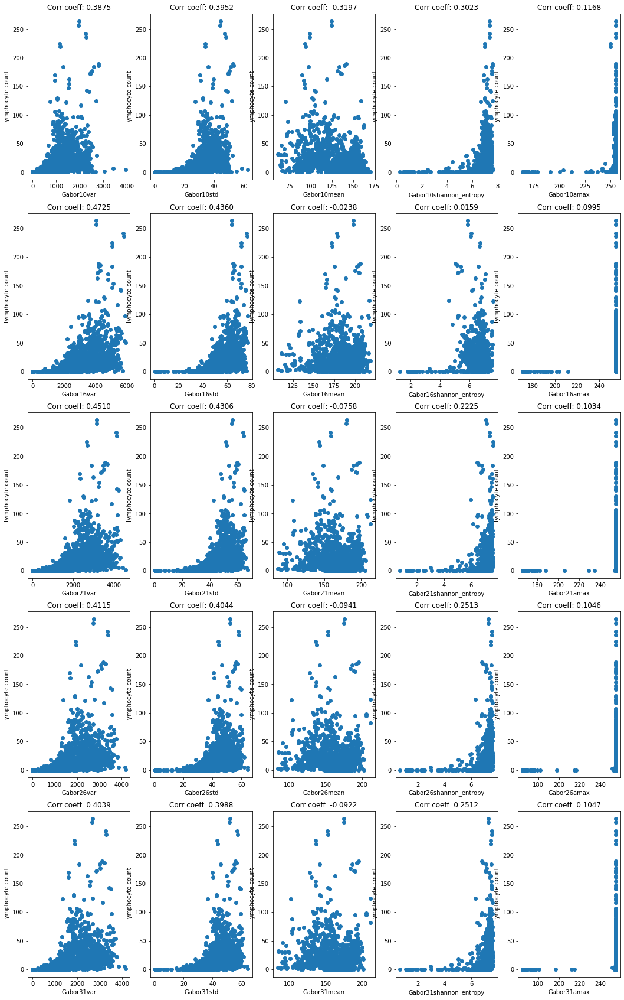

In [73]:
import matplotlib.pyplot as plt
Yfoldlist = [Yfold1,Yfold2,Yfold3]
correlation_coeffs = {}
for fold_num in [1]:
    file_name = 'data/features/gabordatafold'+str(fold_num)+'.npy'
    results_dic = np.load(file_name,allow_pickle=True).item()
    i=1
    fig = plt.figure(figsize=(18,30))
    for key in results_dic.keys():
        plt.subplot(5,5,i)
        x = results_dic[key]
        y = Yfoldlist[fold_num-1]['lymphocyte']
        plt.scatter(x,y)
        plt.xlabel(key)
        plt.ylabel('lymphocyte count')
        corrcoef = np.corrcoef(x,y)[0,1]
        plt.title('Corr coeff: '+str("{:.4f}".format(round(corrcoef, 4))))
        i+=1
        correlation_coeffs[key] = np.corrcoef(x,y)[0,1]
    plt.show()

In [74]:
correlation_coeffs

{'Gabor10var': 0.3874986665622555,
 'Gabor10std': 0.3952334955817114,
 'Gabor10mean': -0.3196525498643438,
 'Gabor10shannon_entropy': 0.3023280462222317,
 'Gabor10amax': 0.11679473567448966,
 'Gabor16var': 0.4725461570964688,
 'Gabor16std': 0.4360097742023914,
 'Gabor16mean': -0.023802183796923736,
 'Gabor16shannon_entropy': 0.015906303374613392,
 'Gabor16amax': 0.0994790961006425,
 'Gabor21var': 0.4510144073801362,
 'Gabor21std': 0.430623590128034,
 'Gabor21mean': -0.07577672595656414,
 'Gabor21shannon_entropy': 0.22251985018284692,
 'Gabor21amax': 0.10340403701812856,
 'Gabor26var': 0.41149188426772015,
 'Gabor26std': 0.4043919995122233,
 'Gabor26mean': -0.09405415083025646,
 'Gabor26shannon_entropy': 0.25133727048650223,
 'Gabor26amax': 0.10457814400161568,
 'Gabor31var': 0.4038843043223405,
 'Gabor31std': 0.39876331740009946,
 'Gabor31mean': -0.0922233984582125,
 'Gabor31shannon_entropy': 0.2511629036661594,
 'Gabor31amax': 0.1046979033638147}

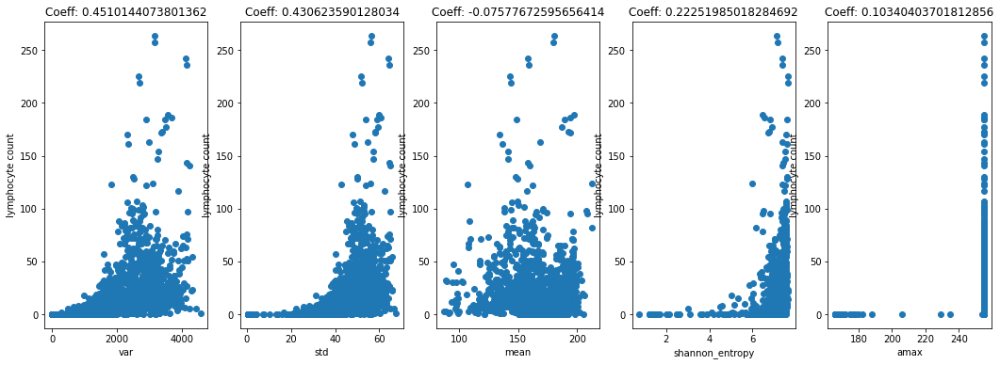

In [75]:
results_dic = feature_plotter(np.load('data/images/gabor_data/gabor21Grayfold1.npy'))

#### Gabor filter 

#### Histogram of Gradients

I chose to consider this feature as it is an interesting feature in image and video analysis.

In [76]:
from skimage.feature import hog
def hog_imagelist_extractor(image_list):
    fd_list = []
    hog_image_list = []
    for image in image_list:
        fd, hog_image = hog(hfold1[0], orientations=16, pixels_per_cell=(8, 8),cells_per_block=(1, 1), visualize=True,)# channel_axis=-1)
        fd_list.append(fd)
        hog_image_list.append(hog_image)
    fd_list = np.array(fd_list)
    hog_image_list = np.array(hog_image_list)
    return fd_list,hog_image_list

In [77]:
# file_names = ['data/images/hfold1.npy','data/images/hfold2.npy','data/images/hfold3.npy']

# for file_name in file_names:
#     image_list = np.load(file_name)
#     print('images loaded')
#     fd_list,hog_image_list = hog_imagelist_extractor(image_list)
#     print('images processed')
#     np.save('HOGfd'+str(file_name[12:-4])+'.npy',fd_list)
#     print('fd saved')
#     np.save('HOGimages'+str(file_name[12:-4])+'.npy',hog_image_list)
#     print('images saved')

In [8]:
import numpy as np
images = np.load('data/images/hog_data/HOGimageshfold1.npy')
fd = np.load('data/images/hog_data/HOGfdhfold1.npy')

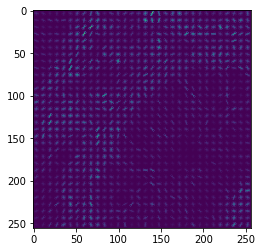

In [79]:
import matplotlib.pyplot as plt
plt.imshow(images[0])

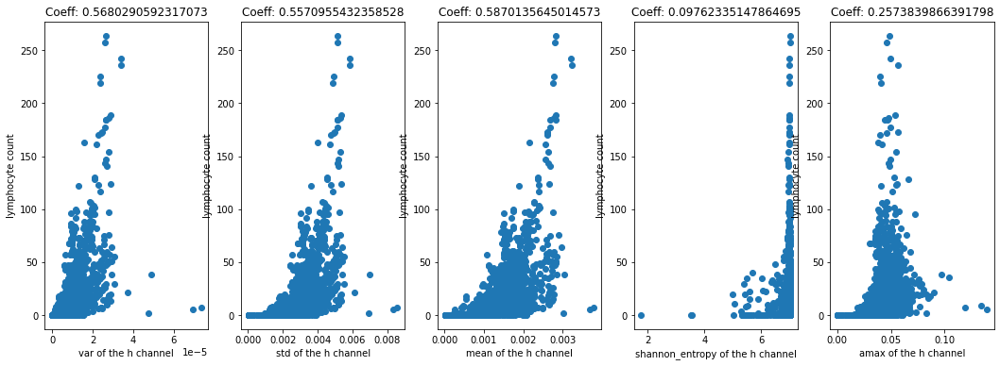

In [80]:
cell_type = 'lymphocyte'
i=1
fig = plt.figure(figsize=(18,6))
results_dic = {}

for feature in features:
    plt.subplot(1,len(features),i)
    i+=1
    x = []
    for im in images:
        x.append(feature(im))
    y = Yfold1[cell_type]
    plt.scatter(x,y)
    plt.xlabel(feature.__name__+str(' of the h channel'))
    plt.ylabel(cell_type+' count')
    plt.title('Coeff: '+str(np.corrcoef(x,y)[0,1]))
    results_dic[feature.__name__] = np.corrcoef(x,y)[0,1]

In [81]:
results_dic

{'var': 0.5680290592317073,
 'std': 0.5570955432358528,
 'mean': 0.5870135645014573,
 'shannon_entropy': 0.09762335147864695,
 'amax': 0.2573839866391798}

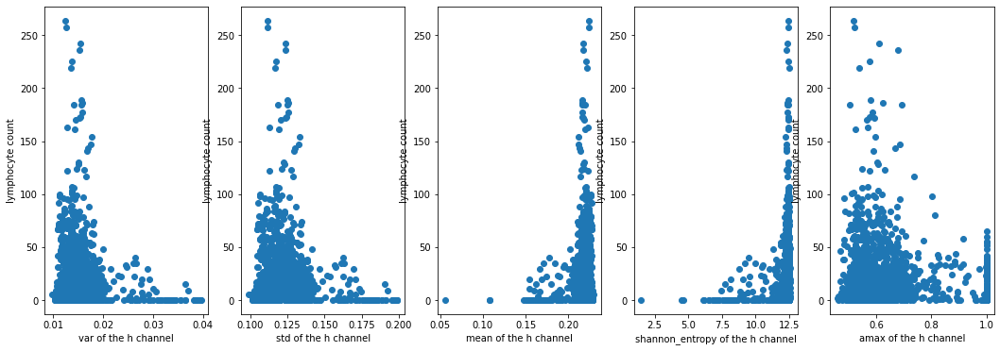

In [82]:
cell_type = 'lymphocyte'
i=1
fig = plt.figure(figsize=(18,6))
results_dic = {}

for feature in features:
    plt.subplot(1,len(features),i)
    i+=1
    x = []
    for im in fd:
        x.append(feature(im))
    y = Yfold1[cell_type]
    plt.scatter(x,y)
    plt.xlabel(feature.__name__+str(' of the h channel'))
    plt.ylabel(cell_type+' count')
    results_dic[feature.__name__] = np.corrcoef(x,y)[0,1]

In [83]:
results_dic

{'var': -0.07530115652795495,
 'std': -0.06046860389147345,
 'mean': 0.08051447706012772,
 'shannon_entropy': 0.1231413701817779,
 'amax': -0.10103480644623729}

variance, std and mean of hog feature is excellent, but fd is not.

saved HOG

In [84]:
# import glob
# file_names = glob.glob('data/images/hog_data/HOGimageshfold*.npy')

# for file_name in file_names:
#     images = np.load(file_name)
#     print(str(file_name)+'images loaded')
#     images = inside_arr_flatten(images)
#     print('images flattened')
#     pca = PCA(0.95)
#     pca.fit(images)
#     print('images fitted')
#     projected = pca.transform(images)
#     print('images projected')
#     np.save('data/pca_images/cpu_pca/'+str(file_name[21:-4])+'projected.npy',projected)
#     print('projections saved')
#     np.save('data/pca_images/cpu_pca/'+str(file_name[21:-4])+'PCA.npy',pca)
#     print('pca saved')

In [85]:
# file_names = ['data/pca_images/cpu_pca/HOGimageshfold1projected.npy','data/pca_images/cpu_pca/HOGimageshfold2projected.npy','data/pca_images/cpu_pca/HOGimageshfold3projected.npy',]

# HOG_PCA_images = []
# for file_name in file_names:
#     HOG_PCA_images.append(np.load(file_name))

In [86]:
# i = 1
# results_dic = {}
# fig = plt.figure(figsize=(18,6))
# images = HOG_PCA_images[0]
# for feature in features:
# #     for images in HOG_PCA_images:
#     plt.subplot(1,5,i)
#     x = []
#     for image in images:
#         x.append(feature(image))
#     x = np.array(x)
#     y = Yfold1['lymphocyte']
# #     print(x.shape,y.shape)
#     plt.scatter(x,y)
#     plt.xlabel(feature.__name__)
#     plt.ylabel('lymphocyte count')
#     plt.title('Corr coeff: '+"{:.6f}".format(np.corrcoef(x,y)[0,1]))
#     i+=1
#     results_dic[feature.__name__] = np.corrcoef(x,y)[0,1]

{'var': 0.5680290592317073,
 'std': 0.5570955432358528,
 'mean': 0.5870135645014573,
 'shannon_entropy': 0.09762335147864695,
 'amax': 0.2573839866391798}

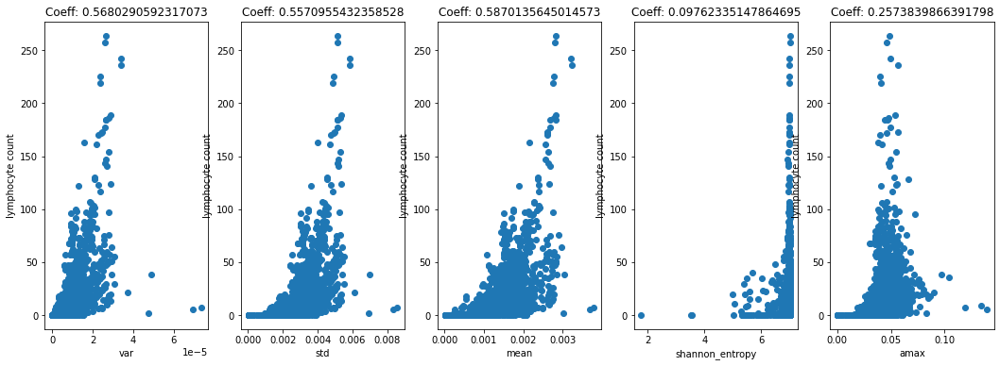

In [87]:
feature_plotter(np.load('data/images/hog_data/HOGimageshfold1.npy'))

frangi

In [2]:
from skimage.filters import frangi

In [3]:
def frangi_list(images):
    returnlist = []
    for im in images:
        returnlist.append(frangi(im))
    returnlist = np.array(returnlist)
    return returnlist

In [5]:
import numpy as np
HOGimageshfold1,HOGimageshfold2,HOGimageshfold3 = np.load('data/images/hog_data/HOGimageshfold1.npy'),np.load('data/images/hog_data/HOGimageshfold2.npy'),np.load('data/images/hog_data/HOGimageshfold3.npy')

In [10]:
frangi_images = frangi_list(HOGimageshfold1)

In [ ]:
# fold_num = 1
# for images in [HOGimageshfold1,HOGimageshfold2,HOGimageshfold3]:
#     frangi_images = frangi_list(images)
#     np.save('data/images/frangi_data/frangihfold'+str(fold_num)+'.npy',frangi_images)
#     fold_num += 1

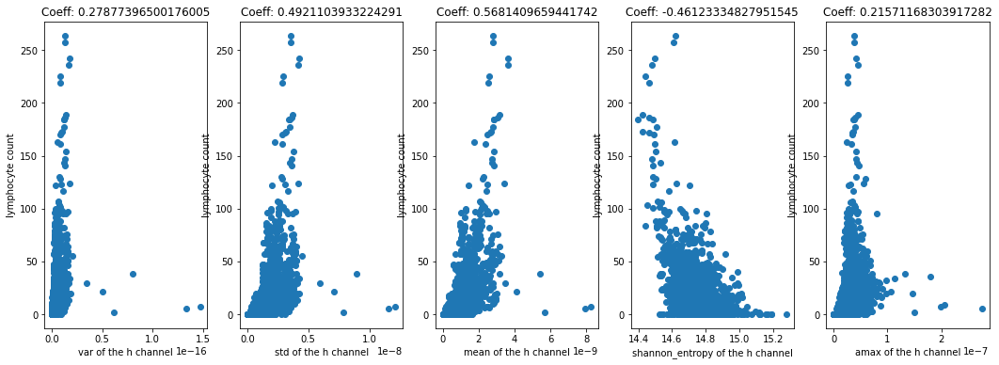

In [24]:
import matplotlib.pyplot as plt
cell_type = 'lymphocyte'
i=1
fig = plt.figure(figsize=(18,6))
results_dic = {}

for feature in features:
    plt.subplot(1,len(features),i)
    i+=1
    x = []
    for im in frangi_images:
        x.append(feature(im))
    y = Yfold1[cell_type]
    plt.scatter(x,y)
    plt.xlabel(feature.__name__+str(' of the h channel'))
    plt.ylabel(cell_type+' count')
    plt.title('Coeff: '+str(np.corrcoef(x,y)[0,1]))
    results_dic[feature.__name__] = np.corrcoef(x,y)[0,1]

In [22]:
results_dic

{'var': 0.27877396500176005,
 'std': 0.4921103933224291,
 'mean': 0.5681409659441742,
 'shannon_entropy': -0.46123334827951545,
 'amax': 0.21571168303917282}

{'var': 0.27877396500176005,
 'std': 0.4921103933224291,
 'mean': 0.5681409659441742,
 'shannon_entropy': -0.46123334827951545,
 'amax': 0.21571168303917282}

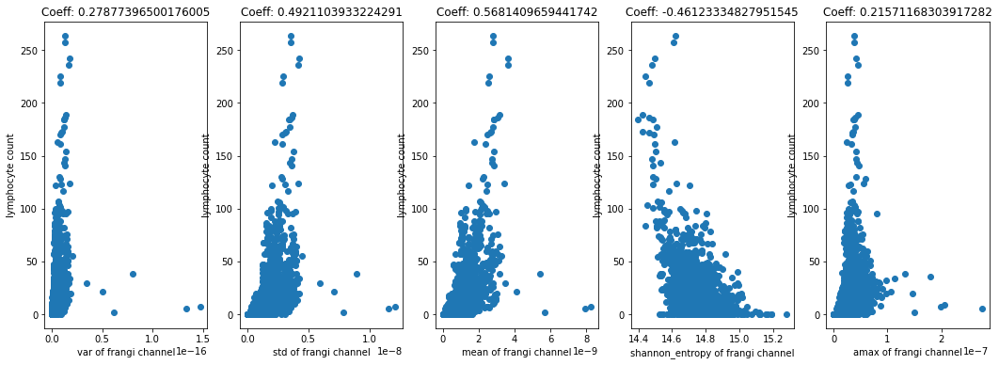

In [26]:
feature_plotter(np.load('data/images/frangi_data/frangihfold1.npy'),xlabelstr = ' of frangi channel')

#### PCA

In [23]:
def convert_to_PCA(x,explained_variance,solver):
    pca = PCA(explained_variance,svd_solver=solver)
    pca.fit(inside_arr_flatten(x)) #training PCA
    return pca

In [24]:
def convert_to_IPCA(x,explained_variance=0.95):
#     num_images = 1000
    pca = IncrementalPCA(n_components=1000, batch_size=200)
#     pca.partial_fit([color.rgb2gray(im).flatten() for im in X[:num_images, :]])
    pca.partial_fit(inside_arr_flatten(x))
#     projected = pca.transform([color.rgb2gray(im).flatten() for im in X[:num_images, :]]) #projecting the data onto Principal components
    return pca

In [25]:
from sklearn.decomposition import PCA, IncrementalPCA #randomized PCA is a parameter in PCA

In [27]:
# for i in [0,1,2]:
#     pca = PCA(0.95)
#     pca.fit(inside_arr_flatten(Xfold1[:,:,:,i])) #training PCA
#     projectedXfold1 = pca.transform(inside_arr_flatten(Xfold1[:,:,:,i]))
#     np.save('pcaChannel'+str(i)+'.npy',projectedXfold1)

In [28]:
# Gabor31Gray = np.load('data/images/Gabor31Gray.npy')

In [29]:
# pca = PCA(0.95)
# pca.fit(inside_arr_flatten(Gabor31Gray)) #training PCA
# projectedXfold1 = pca.transform(Gabor31Gray)
# np.save('pcaGabor31Gray.npy',projectedXfold1)

In [31]:
def inside_arr_flatten(x):
    return np.array([im.flatten() for im in x])

In [32]:
file_names = ['data/images/Gabor31Gray.npy','data/images/Gabor26Gray.npy','data/images/Gabor21Gray.npy','data/images/Gabor16Gray.npy','data/images/Gabor10Gray.npy','data/images/fast_glcm_ene5.npy','data/images/fast_glcm_ASM5.npy','data/images/fast_glcm_entropy5.npy','data/images/fast_glcm_max5.npy','data/images/fast_glcm_homogeneity5.npy','data/images/fast_glcm_dissimilarity5.npy','data/images/fast_glcm_contrast5.npy','data/images/fast_glcm_std5.npy','data/images/fast_glcm_mean5.npy']

In [33]:
file_names = ['data/images/fast_glcm_ene5.npy','data/images/fast_glcm_ASM5.npy','data/images/fast_glcm_entropy5.npy','data/images/fast_glcm_max5.npy','data/images/fast_glcm_homogeneity5.npy','data/images/fast_glcm_dissimilarity5.npy','data/images/fast_glcm_contrast5.npy','data/images/fast_glcm_std5.npy','data/images/fast_glcm_mean5.npy']

In [ ]:
#cpu pca

for file_name in file_names:
    images = np.load(file_name)
    print(str(file_name)+'images loaded')
    images = inside_arr_flatten(images)
    print('images flattened')
    pca = PCA(0.95)
    pca.fit(images)
    print('images fitted')
    projected = pca.transform(images)
    print('images projected')
    np.save('data/pca_images/'+str(file_name[12:-4])+'projected.npy',projected)
    print('projections saved')
    np.save('data/pca_images/'+str(file_name[12:-4])+'PCA.npy',pca)
    print('pca saved')

data/images/Gabor31Gray.npyimages loaded
images flattened


In [30]:
'data/images/hog_data/HOGimageshfold3.npy'[21:-4]

'HOGimageshfold3'

In [31]:
import glob
file_names = glob.glob('data/images/hog_data/HOGimageshfold*.npy')

for file_name in file_names:
    images = np.load(file_name)
    print(str(file_name)+'images loaded')
    images = inside_arr_flatten(images)
    print('images flattened')
    pca = PCA(0.95)
    pca.fit(images)
    print('images fitted')
    projected = pca.transform(images)
    print('images projected')
    np.save('data/pca_images/cpu_pca/'+str(file_name[21:-4])+'projected.npy',projected)
    print('projections saved')
    np.save('data/pca_images/cpu_pca/'+str(file_name[21:-4])+'PCA.npy',pca)
    print('pca saved')

data/images/hog_data/HOGimageshfold2.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/hog_data/HOGimageshfold1.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/hog_data/HOGimageshfold3.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved


In [20]:
#gpu pca

import pycuda.autoinit
import pycuda.gpuarray as gpuarray
import numpy as np
import skcuda.linalg as linalg
from skcuda.linalg import PCA as cuPCA

/opt/conda/lib/python3.8/site-packages/skcuda/cublas.py:284: UserWarning: creating CUBLAS context to get version number
  warnings.warn('creating CUBLAS context to get version number')


In [21]:
a = np.load('data/images/hfold1.npy')

In [34]:
images = inside_arr_flatten(a)
images = images.astype(np.float64)
pca = cuPCA(n_components=1000)
X_gpu = gpuarray.GPUArray(images.shape, np.float64, order="F") # note that order="F" or a transpose is necessary. fit_transform requires row-major matrices, and column-major is the default
X_gpu.set(images)
projected = pca.fit_transform(X_gpu)

In [35]:
type(projected)

pycuda.gpuarray.GPUArray

In [ ]:
np.var(projected)

In [26]:
projected = np.array(projected)

In [27]:
projected

array([[array(-293.07473269), array(25.25347683), array(-13.5198855),
        ..., array(-0.01029802), array(0.0181407), array(0.03335993)],
       [array(-293.07709799), array(25.23183407), array(-13.5029161),
        ..., array(0.02619576), array(-0.00434375), array(-0.04136714)],
       [array(-293.07733649), array(25.20014858), array(-13.47921013),
        ..., array(-0.0005237), array(0.01494601), array(0.03768645)],
       ...,
       [array(-292.783083), array(-30.68494533), array(-6.15110534), ...,
        array(-0.00197471), array(-0.00396592), array(-0.02589727)],
       [array(-292.77646005), array(-30.71167002), array(-6.16625573),
        ..., array(0.03624381), array(-0.0081699), array(0.01441117)],
       [array(-292.77251916), array(-30.74487403), array(-6.18257327),
        ..., array(-0.03428642), array(0.01147198), array(0.00492819)]],
      dtype=object)

In [33]:
projected[0][0]

array(-293.07473269)

In [61]:
for file_name in file_names:
    images = np.load(file_name)
    print(str(file_name)+'images loaded')
    images = inside_arr_flatten(images)
    print('images flattened')
    images = images.astype(np.float64)
    pca = cuPCA(n_components=1000) # map the data to 4 dimensions
    # X = np.random.rand(1000,100) # 1000 samples of 100-dimensional data vectors
#     images = images/255
    X_gpu = gpuarray.GPUArray(images.shape, np.float64, order="F") # note that order="F" or a transpose is necessary. fit_transform requires row-major matrices, and column-major is the default
    X_gpu.set(images)
    print('images fitted')
    projected = pca.fit_transform(X_gpu)
    print('images projected')
    np.save('data/pca_images/'+str(file_name[12:-4])+'projected.npy',projected)
    print('projections saved')
    np.save('data/pca_images/'+str(file_name[12:-4])+'PCA.npy',pca)
    print('pca saved')

data/images/fast_glcm_ene5.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/fast_glcm_ASM5.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/fast_glcm_entropy5.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/fast_glcm_max5.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/fast_glcm_homogeneity5.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/fast_glcm_dissimilarity5.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/fast_glcm_contrast5.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/fast_glcm_std5.npyimages loaded
images flattened
images fitted
images projected
projections saved
pca saved
data/images/f

In testing PCA coefficient features gave very low correlation, so were omitted for the regression.

Results

In [27]:
rResults = [0.43930548767583616,0.4464213396356337,-0.400264286417796,0.3404576111750108,0.02695118277660994]
gResults = [0.1458180326867103,0.18441146433671202,-0.4479125711631828,0.2437916319542139,-0.3242833399739893]
bResults = [0.24711487066318907,0.3175032217270504,-0.4067679033256346,0.31710020912141307,0.03784030834446055]
hResults =[0.5059295962096414,0.5182413168373621,0.37758024100725773,0.22878874030414928,0.1942356506608959]
eResults =[0.17618211558294744,0.2819944317908257,0.38534455850141053,0.26614162850613227,0.18333772448239685]
dResults =[0.0681357058125895,0.2320587758678041,0.31172391684157363,0.22408564212992255,0.05138996662192897]
gabor21Results = [0.4510144073801362,0.430623590128034,-0.07577672595656414,0.22251985018284692,0.10340403701812856]
hogResults =[0.5680290592317073,0.5570955432358528,0.5870135645014573,0.09762335147864695,0.2573839866391798]
frangiResults =[0.27877396500176005,0.4921103933224291,0.5681409659441742,-0.46123334827951545,0.21571168303917282]

In [28]:
columns = ('var','std','mean','entropy','amax')
rows = ['r','g','b','h','e','d','gabor21','hog','frangi']
data = [rResults,gResults,bResults,hResults,eResults,dResults,gabor21Results,hogResults,frangiResults]

In [29]:
newdata = []
for d in data:
    newd = [round(float(i), 5) for i in d]
    newdata.append(newd)

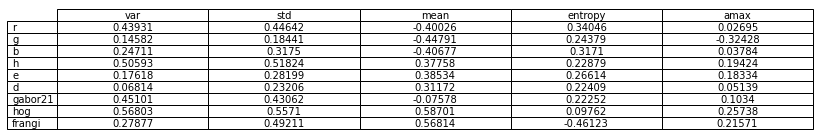

In [30]:
fig = plt.figure(figsize=(25,5))
fig.subplots_adjust(left=0.2,top=0.8, wspace=1)

tab= plt.subplot2grid((4,3), (0,0), colspan=2, rowspan=2)
tab.table(cellText=newdata,
          rowLabels=rows,
          cellLoc='center',
          colLabels=columns, loc="upper center")

tab.axis("off")
plt.show()

In [31]:
flattenedData = np.array(newdata).flatten()

In [32]:
num_of_features = 15
index_nums = sorted(range(len(flattenedData)), key=lambda i: np.abs(flattenedData[i]))[-num_of_features:][::-1]

In [33]:
sig_features = ''
for index in index_nums:
    sig_features += rows[index//5]+columns[index%5]+', '
print('Most sigificant features are:',sig_features)

Most sigificant features are: hogmean, frangimean, hogvar, hogstd, hstd, hvar, frangistd, frangientropy, gabor21var, gmean, rstd, rvar, gabor21std, bmean, rmean, 


#### GLCM results

In [34]:
glcm_features =  {'fast_glcm_ene5': -0.3057102405866259,
 'fast_glcm_ASM5': -0.29862088571440193,
 'fast_glcm_entropy5': 0.3054898362323949,
 'fast_glcm_max5': -0.3072937970560344,
 'fast_glcm_homogeneity5': -0.2365681999765993,
 'fast_glcm_dissimilarity5': 0.22747910276188033,
 'fast_glcm_contrast5': 0.18645077999165588,
 'fast_glcm_std5': -0.43248336742283516,
 'fast_glcm_mean5': -0.44361589641189614}

I will include features with a correlation coefficient > 0.4

#### ii. Try the following regression models with the features used in part-I. Plot the scatter plot
between true and predicted counts for each type of regression model for the test data.
Also, report your prediction performance in terms of RMSE, Pearson Correlation
Coefficient, Spearman Correlation Coefficient and R2 score (https://scikitlearn.org/stable/modules/classes.html#module-sklearn.metrics) on the test data.

#### a. Ordinary Least Squares (OLS) regression

In [17]:
from sklearn.linear_model import LinearRegression

In [18]:
from sklearn.model_selection import train_test_split
# X_train,X_test,Y_train,Y_test = train_test_split()

#### Data preparation

from analysis, hogmean, frangimean, hogvar, hogstd, hstd, hvar, frangistd, frangientropy, gabor21var, gmean, rstd, rvar, gabor21std, bmean, rmean, fast_glcm_std5, fast_glcm_mean5 are the best feature with correlation coefficient > 0.4

#### Statistical features

In [19]:
def feature_getter(images,feature):
    x = []
    for im in images:
        x.append(feature(im))
    x = np.array(x)
    return np.array(x)

In [29]:
# def construct_regression_input(x):
#     regression_features = []
#     for item in x:
#         regression_features.append(feature_getter(item[0],item[1]))
#     return regression_features

hogmean, frangimean, hogvar, hogstd, hstd, hvar, frangistd, frangientropy, gabor21var, gmean, rstd, rvar, gabor21std, bmean, rmean, fast_glcm_std5, fast_glcm_mean5

In [30]:
r_folds = input_image_fold_designator(X[:,:,:,0],return_param=0)
g_folds = input_image_fold_designator(X[:,:,:,1],return_param=0)
b_folds = input_image_fold_designator(X[:,:,:,2],return_param=0)

fold1 (Training)

In [31]:
rfold1 = r_folds[0]
gfold1 = g_folds[0]
bfold1 = b_folds[0]

In [32]:
hogfold1 = np.load('data/images/hog_data/HOGimageshfold1.npy')
frangifold1 = np.load('data/images/frangi_data/frangihfold1.npy')
hfold1 = np.load('data/images/hfold1.npy')
gaborfold1 = np.load('data/features/gabordatafold1.npy',allow_pickle=True)
fast_glcmfold1 = np.load('data/features/glcmdatafold1.npy',allow_pickle=True)

In [33]:
hogmeanfold1 = feature_getter(hogfold1,np.mean)
frangimeanfold1 = feature_getter(frangifold1,np.mean)
hogvarfold1 = feature_getter(hogfold1,np.var)
hogstdfold1 = feature_getter(hogfold1,np.std)
hstdfold1 = feature_getter(hfold1,np.std)
hvarfold1 = feature_getter(hfold1,np.var)
frangistdfold1 = feature_getter(frangifold1,np.std)
frangientropyfold1 = feature_getter(frangifold1,shannon_entropy)
gabor21varfold1 = gaborfold1.item()['Gabor21var']
gmeanfold1 = feature_getter(gfold1,np.mean)
rstdfold1 = feature_getter(rfold1,np.std)
rvarfold1 = feature_getter(rfold1,np.var)
gabor21stdfold1 = gaborfold1.item()['Gabor21std']
bmeanfold1 = feature_getter(bfold1,np.mean)
rmeanfold1 = feature_getter(rfold1,np.mean)
fast_glcm_std5fold1 = fast_glcmfold1.item()['fast_glcm_std5']
fast_glcm_mean5fold1 = fast_glcmfold1.item()['fast_glcm_mean5']

In [34]:
regression_features_fold1 = np.array([hogmeanfold1,frangimeanfold1,hogvarfold1,hogstdfold1,hstdfold1,hvarfold1,frangistdfold1,frangientropyfold1,gabor21varfold1,gmeanfold1,rstdfold1,rvarfold1,gabor21stdfold1,bmeanfold1,rmeanfold1,fast_glcm_std5fold1,fast_glcm_mean5fold1])

In [35]:
for i in regression_features_fold1:
    print(i.shape)

(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)
(1622,)


In [36]:
regression_features_fold1.shape

(17, 1622)

In [37]:
concatfold1 = np.concatenate(regression_features_fold1)

In [38]:
concatfold1.shape

(27574,)

In [39]:
regression_features_fold1.swapaxes(0,1).shape

(1622, 17)

In [40]:
regression_statistical_features_fold1 = np.swapaxes(regression_features_fold1,0,1)

In [41]:
regression_features_fold1.shape

(17, 1622)

fold2 (Validation)

In [42]:
rfold2 = r_folds[1]
gfold2 = g_folds[1]
bfold2 = b_folds[1]

In [43]:
hogfold2 = np.load('data/images/hog_data/HOGimageshfold2.npy')
frangifold2 = np.load('data/images/frangi_data/frangihfold2.npy')
hfold2 = np.load('data/images/hfold2.npy')
gaborfold2 = np.load('data/features/gabordatafold2.npy',allow_pickle=True)
fast_glcmfold2 = np.load('data/features/glcmdatafold2.npy',allow_pickle=True)

In [44]:
hogmeanfold2 = feature_getter(hogfold2,np.mean)
frangimeanfold2 = feature_getter(frangifold2,np.mean)
hogvarfold2 = feature_getter(hogfold2,np.var)
hogstdfold2 = feature_getter(hogfold2,np.std)
hstdfold2 = feature_getter(hfold2,np.std)
hvarfold2 = feature_getter(hfold2,np.var)
frangistdfold2 = feature_getter(frangifold2,np.std)
frangientropyfold2 = feature_getter(frangifold2,shannon_entropy)
gabor21varfold2 = gaborfold2.item()['Gabor21var']
gmeanfold2 = feature_getter(gfold2,np.mean)
rstdfold2 = feature_getter(rfold2,np.std)
rvarfold2 = feature_getter(rfold2,np.var)
gabor21stdfold2 = gaborfold2.item()['Gabor21std']
bmeanfold2 = feature_getter(bfold2,np.mean)
rmeanfold2 = feature_getter(rfold2,np.mean)
fast_glcm_std5fold2 = fast_glcmfold2.item()['fast_glcm_std5']
fast_glcm_mean5fold2 = fast_glcmfold2.item()['fast_glcm_mean5']

In [45]:
regression_features_fold2 = [hogmeanfold2,frangimeanfold2,hogvarfold2,hogstdfold2,hstdfold2,hvarfold2,frangistdfold2,frangientropyfold2,gabor21varfold2,gmeanfold2,rstdfold2,rvarfold2,gabor21stdfold2,bmeanfold2,rmeanfold2,fast_glcm_std5fold2,fast_glcm_mean5fold2]

In [46]:
for i in regression_features_fold2:
    print(i.shape)

(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)
(1751,)


In [47]:
concatfold2 = np.concatenate(regression_features_fold2)

In [48]:
concatfold2.shape

(29767,)

In [49]:
regression_statistical_features_fold2 = np.swapaxes(regression_features_fold2,0,1)

fold3 (Test)

In [50]:
rfold3 = r_folds[2]
gfold3 = g_folds[2]
bfold3 = b_folds[2]

In [51]:
hogfold3 = np.load('data/images/hog_data/HOGimageshfold3.npy')
frangifold3 = np.load('data/images/frangi_data/frangihfold3.npy')
hfold3 = np.load('data/images/hfold3.npy')
gaborfold3 = np.load('data/features/gabordatafold3.npy',allow_pickle=True)
fast_glcmfold3 = np.load('data/features/glcmdatafold3.npy',allow_pickle=True)

In [52]:
hogmeanfold3 = feature_getter(hogfold3,np.mean)
frangimeanfold3 = feature_getter(frangifold3,np.mean)
hogvarfold3 = feature_getter(hogfold3,np.var)
hogstdfold3 = feature_getter(hogfold3,np.std)
hstdfold3 = feature_getter(hfold3,np.std)
hvarfold3 = feature_getter(hfold3,np.var)
frangistdfold3 = feature_getter(frangifold3,np.std)
frangientropyfold3 = feature_getter(frangifold3,shannon_entropy)
gabor21varfold3 = gaborfold3.item()['Gabor21var']
gmeanfold3 = feature_getter(gfold3,np.mean)
rstdfold3 = feature_getter(rfold3,np.std)
rvarfold3 = feature_getter(rfold3,np.var)
gabor21stdfold3 = gaborfold3.item()['Gabor21std']
bmeanfold3 = feature_getter(bfold3,np.mean)
rmeanfold3 = feature_getter(rfold3,np.mean)
fast_glcm_std5fold3 = fast_glcmfold3.item()['fast_glcm_std5']
fast_glcm_mean5fold3 = fast_glcmfold3.item()['fast_glcm_mean5']

In [53]:
regression_features_fold3 = [hogmeanfold3,frangimeanfold3,hogvarfold3,hogstdfold3,hstdfold3,hvarfold3,frangistdfold3,frangientropyfold3,gabor21varfold3,gmeanfold3,rstdfold3,rvarfold3,gabor21stdfold3,bmeanfold3,rmeanfold3,fast_glcm_std5fold3,fast_glcm_mean5fold3]

In [54]:
for i in regression_features_fold3:
    print(i.shape)

(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)
(1608,)


In [55]:
concatfold3 = np.concatenate(regression_features_fold3)

In [56]:
concatfold3.shape

(27336,)

In [57]:
regression_statistical_features_fold3 = np.swapaxes(regression_features_fold3,0,1)

#### PCA applied on images

In [ ]:
fold_nums = [1,2,3]

In [ ]:
import glob
file_names_fold1 = glob.glob('data/pca_images/cpu_pca/*1*.npy')
file_names_fold2 = glob.glob('data/pca_images/cpu_pca/*2*.npy')
file_names_fold3 = glob.glob('data/pca_images/cpu_pca/*3*.npy')

In [ ]:
a = np.load(file_names_fold1[0])

In [ ]:
a.shape

#### Image Features

In [48]:
# hogimagesfold1 = np.load('data/images/hog_data/HOGimageshfold1.npy')
# hogimagesfold2 = np.load('data/images/hog_data/HOGimageshfold2.npy')
# hogimagesfold3 = np.load('data/images/hog_data/HOGimageshfold3.npy')

In [48]:
flattened_hogimagesfold1 = np.array([im.flatten() for im in hogfold1])
flattened_hogimagesfold2 = np.array([im.flatten() for im in hogfold2])
flattened_hogimagesfold3 = np.array([im.flatten() for im in hogfold3])

#### Regression

In [ ]:
# xTrain = np.load('data/images/hog_data/HOGimageshfold1.npy')

# xTest = np.load('data/images/hog_data/HOGimageshfold2.npy')

# xVal = np.load('data/images/hog_data/HOGimageshfold3.npy')

# xTrain.shape

# xTrainFlattened = np.array([im.flatten() for im in xTrain])

# xTrainFlattened.shape

# mean = np.array([np.mean(i) for i in xTrainFlattened])

# mean.shape

# xTestFlattened = np.array([im.flatten() for im in xTest])

# reg = LinearRegression().fit(mean.reshape(-1, 1),Yfold1['lymphocyte'])

# reg.score(np.array([np.mean(i) for i in xTestFlattened]).reshape(-1, 1),Yfold2['lymphocyte'])

# reg = LinearRegression().fit(np.concatenate(mean,),Yfold1['lymphocyte'])

# reg.score(np.array([np.mean(i) for i in xTestFlattened]).reshape(-1, 1),Yfold2['lymphocyte'])

Only statistical features of images

In [16]:
from sklearn.metrics import mean_squared_error
from scipy.stats import spearmanr

In [50]:
xTrain = regression_statistical_features_fold1
xVal = regression_statistical_features_fold2
xTest = regression_statistical_features_fold3

In [51]:
xTrain.shape

(1622, 17)

In [52]:
Yfold3['lymphocyte'].shape

(1608,)

In [56]:
reg = LinearRegression().fit(xTrain,Yfold1['lymphocyte'])

In [57]:
reg.score(xTrain,Yfold1['lymphocyte'])

0.6622287787023973

In [58]:
reg.score(xVal,Yfold2['lymphocyte'])

0.48998589095245126

Prediction performance

In [59]:
y_pred = reg.predict(xTest)

R2 Score

In [15]:
reg.score(xTest,Yfold3['lymphocyte'])

0.36851772816642847

RMSE

In [60]:
mean_squared_error(Yfold3['lymphocyte'],y_pred, squared=False)

23.48096646673929

Pearson Correlation Coefficient

In [61]:
np.corrcoef(Yfold3['lymphocyte'],y_pred)[0,1]

0.665849985757414

Spearman Correlation Coefficient

In [62]:
spearmanr(Yfold3['lymphocyte'],y_pred)

SpearmanrResult(correlation=0.578668839656502, pvalue=2.1700590019528617e-144)

Scatter plot

Text(0, 0.5, 'Actual lymphocyte count')

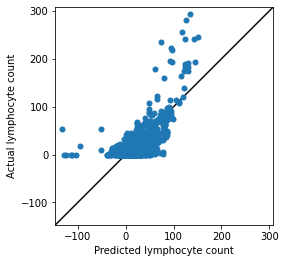

In [79]:
x = y_pred
y = Yfold3['lymphocyte']
# now sort it just to make it look like it's related

fig, ax = plt.subplots()
ax.scatter(x, y, s=25, cmap=plt.cm.coolwarm, zorder=10)

lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax.plot(lims, lims, color = 'black', alpha=0.95)
ax.set_aspect('equal')
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_xlabel('Predicted lymphocyte count')
ax.set_ylabel('Actual lymphocyte count')

Including all statistical features together

In [ ]:
def all_features(image_list):
    returnlist = []
    for images in image_list:
        if type(images) == dict:
            for key in images.keys():
                returnlist.append(images[key])
        else:
            for feature in features:
                returnlist.append(feature_getter(images,feature))
    return np.array(returnlist)

In [ ]:
allfeaturesfold1 = all_features([hfold1,r_folds[0],g_folds[0],b_folds[0],hogfold1,frangifold1,fast_glcmfold1.item(),gaborfold1.item()])

In [ ]:
allfeaturesfold2 = all_features([hfold2,r_folds[1],g_folds[1],b_folds[1],hogfold2,frangifold2,fast_glcmfold2.item(),gaborfold2.item()])

In [ ]:
allfeaturesfold3 = all_features([hfold3,r_folds[2],g_folds[2],b_folds[2],hogfold3,frangifold3,fast_glcmfold3.item(),gaborfold3.item()])

In [84]:
# np.save('data/features/allfeaturesfold1.npy',allfeaturesfold1)

In [85]:
# np.save('data/features/allfeaturesfold2.npy',allfeaturesfold2)

In [86]:
# np.save('data/features/allfeaturesfold3.npy',allfeaturesfold3)

In [87]:
xTrain = np.swapaxes(allfeaturesfold1,0,1)
xVal = np.swapaxes(allfeaturesfold2,0,1)
xTest = np.swapaxes(allfeaturesfold3,0,1)

In [88]:
xTrain.shape

(1622, 64)

In [89]:
reg = LinearRegression().fit(xTrain,Yfold1['lymphocyte'])

In [90]:
reg.score(xTrain,Yfold1['lymphocyte'])

0.7689907568435737

In [91]:
reg.score(xVal,Yfold2['lymphocyte'])

0.5501956077634329

prediction performance

In [92]:
y_pred = reg.predict(xTest)

RMSE

In [93]:
mean_squared_error(Yfold3['lymphocyte'],y_pred, squared=False)

20.15616029346454

Pearson Correlation Coefficient

In [94]:
np.corrcoef(Yfold3['lymphocyte'],y_pred)[0,1]

0.7727272850036682

Spearman Correlation Coefficient

In [95]:
spearmanr(Yfold3['lymphocyte'],y_pred)

SpearmanrResult(correlation=0.6504463768437567, pvalue=4.580866634918407e-194)

R2 Score

In [96]:
reg.score(xTest,Yfold3['lymphocyte'])

0.534687378323053

R2 Score

In [97]:
reg.score(xTest,Yfold3['lymphocyte'])

0.534687378323053

Scatter plot

Text(0, 0.5, 'Actual lymphocyte count')

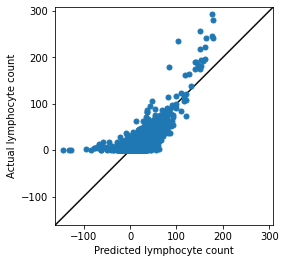

In [99]:
x = y_pred
y = Yfold3['lymphocyte']
# now sort it just to make it look like it's related

fig, ax = plt.subplots()
ax.scatter(x, y, s=25, cmap=plt.cm.coolwarm, zorder=10)

lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax.plot(lims, lims, color = 'black', alpha=0.95)
ax.set_aspect('equal')
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_xlabel('Predicted lymphocyte count')
ax.set_ylabel('Actual lymphocyte count')

All statistical features and HOG images because these performed particularly well

In [58]:
xTrain = np.swapaxes(allfeaturesfold1,0,1)
xVal = np.swapaxes(allfeaturesfold2,0,1)
xTest = np.swapaxes(allfeaturesfold3,0,1)

In [ ]:
xTrain.shape

In [59]:
newxTrain = np.concatenate((xTrain,np.array([im.flatten() for im in np.load('data/images/hog_data/HOGimageshfold1.npy')])),axis=-1)

In [61]:
# np.save('data/final_regression/newxTrain.npy',newxTrain)

In [62]:
newxVal = np.concatenate((xVal,np.array([im.flatten() for im in np.load('data/images/hog_data/HOGimageshfold2.npy')])),axis=-1)

In [63]:
# np.save('data/final_regression/newxVal.npy',newxVal)

In [64]:
newxTest = np.concatenate((xTest,np.array([im.flatten() for im in np.load('data/images/hog_data/HOGimageshfold3.npy')])),axis=-1)

In [65]:
# np.save('data/final_regression/newxTest.npy',newxTest)

In [5]:
newxTrain = np.load('data/final_regression/newxTrain.npy')
newxVal = np.load('data/final_regression/newxVal.npy')
newxTest = np.load('data/final_regression/newxTest.npy')

In [10]:
newxTrain.shape

(1622, 65600)

In [11]:
reg = LinearRegression().fit(newxTrain,Yfold1['lymphocyte'])

In [12]:
reg.score(newxTrain,Yfold1['lymphocyte'])

1.0

In [13]:
reg.score(newxVal,Yfold2['lymphocyte'])

0.2534365907651627

prediction performance

In [14]:
y_pred = reg.predict(newxTest)

RMSE

In [15]:
mean_squared_error(Yfold3['lymphocyte'],y_pred, squared=False)

22.946041782921988

Pearson Correlation Coefficient

In [16]:
np.corrcoef(Yfold3['lymphocyte'],y_pred)[0,1]

0.661053137853066

Spearman Correlation Coefficient

In [17]:
spearmanr(Yfold3['lymphocyte'],y_pred)

SpearmanrResult(correlation=0.6122666061861505, pvalue=4.7377525015328243e-166)

R2 Score

In [18]:
reg.score(newxTest,Yfold3['lymphocyte'])

0.39696185217754365

R2 Score

In [19]:
reg.score(newxTest,Yfold3['lymphocyte'])

0.39696185217754365

Scatter plot

Text(0, 0.5, 'Actual lymphocyte count')

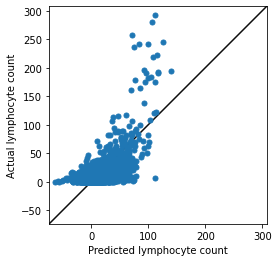

In [21]:
import matplotlib.pyplot as plt
x = y_pred
y = Yfold3['lymphocyte']
# now sort it just to make it look like it's related

fig, ax = plt.subplots()
ax.scatter(x, y, s=25, cmap=plt.cm.coolwarm, zorder=10)

lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax.plot(lims, lims, color = 'black', alpha=0.95)
ax.set_aspect('equal')
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_xlabel('Predicted lymphocyte count')
ax.set_ylabel('Actual lymphocyte count')

#### b. Support Vector Regression

In [23]:
from sklearn.svm import SVR

All statistical features

In [ ]:
xTrain = np.swapaxes(allfeaturesfold1,0,1)
xVal = np.swapaxes(allfeaturesfold2,0,1)
xTest = np.swapaxes(allfeaturesfold3,0,1)

In [ ]:
regSVR = SVR().fit(xTrain,Yfold1['lymphocyte'])

In [78]:
regSVR.score(xTrain,Yfold1['lymphocyte'])

0.146892986194061

In [79]:
regSVR.score(xVal,Yfold2['lymphocyte'])

0.09981751151184481

prediction performance

In [80]:
y_pred = regSVR.predict(xTest)

RMSE

In [84]:
mean_squared_error(Yfold3['lymphocyte'],y_pred, squared=False)

27.17109785311739

Pearson Correlation Coefficient

In [85]:
np.corrcoef(Yfold3['lymphocyte'],y_pred)[0,1]

0.42173221172585923

Spearman Correlation Coefficient

In [86]:
spearmanr(Yfold3['lymphocyte'],y_pred)

SpearmanrResult(correlation=0.6804538692869926, pvalue=4.206252598021813e-219)

R2 Score

In [88]:
regSVR.score(xTest,Yfold3['lymphocyte'])

0.15444161786109023

Scatter plot

Text(0, 0.5, 'Actual lymphocyte count')

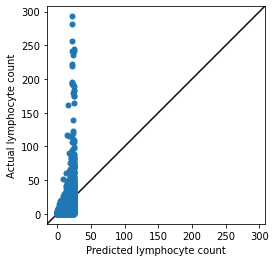

In [90]:
import matplotlib.pyplot as plt
x = y_pred
y = Yfold3['lymphocyte']
# now sort it just to make it look like it's related

fig, ax = plt.subplots()
ax.scatter(x, y, s=25, cmap=plt.cm.coolwarm, zorder=10)

lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax.plot(lims, lims, color = 'black', alpha=0.95)
ax.set_aspect('equal')
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_xlabel('Predicted lymphocyte count')
ax.set_ylabel('Actual lymphocyte count')

All statistical features + hog images

In [ ]:
newxTrain = np.concatenate((xTrain,np.array([im.flatten() for im in np.load('data/images/hog_data/HOGimageshfold1.npy')])),axis=-1)

In [ ]:
newxVal = np.concatenate((xVal,np.array([im.flatten() for im in np.load('data/images/hog_data/HOGimageshfold2.npy')])),axis=-1)

In [ ]:
newxTest = np.concatenate((xTest,np.array([im.flatten() for im in np.load('data/images/hog_data/HOGimageshfold3.npy')])),axis=-1)

In [20]:
newxTrain = np.load('data/final_regression/newxTrain.npy')
newxVal = np.load('data/final_regression/newxVal.npy')
newxTest = np.load('data/final_regression/newxTest.npy')

In [21]:
newxTrain.shape

(1622, 65600)

In [24]:
regSVR = SVR().fit(newxTrain,Yfold1['lymphocyte'])

In [25]:
regSVR.score(newxTrain,Yfold1['lymphocyte'])

0.14279695873246334

In [26]:
regSVR.score(newxVal,Yfold2['lymphocyte'])

0.09729495990768133

prediction performance

In [27]:
y_pred = regSVR.predict(newxTest)

RMSE

In [28]:
mean_squared_error(Yfold3['lymphocyte'],y_pred, squared=False)

27.18889203794151

Pearson Correlation Coefficient

In [29]:
np.corrcoef(Yfold3['lymphocyte'],y_pred)[0,1]

0.42214891137681654

Spearman Correlation Coefficient

In [30]:
spearmanr(Yfold3['lymphocyte'],y_pred)

SpearmanrResult(correlation=0.680118297338786, pvalue=8.327184730706487e-219)

R2 Score

In [31]:
regSVR.score(newxTest,Yfold3['lymphocyte'])

0.15333375324800824

Scatter plot

Text(0, 0.5, 'Actual lymphocyte count')

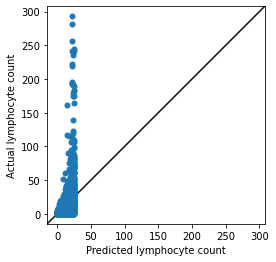

In [33]:
import matplotlib.pyplot as plt
x = y_pred
y = Yfold3['lymphocyte']
# now sort it just to make it look like it's related

fig, ax = plt.subplots()
ax.scatter(x, y, s=25, cmap=plt.cm.coolwarm, zorder=10)

lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax.plot(lims, lims, color = 'black', alpha=0.95)
ax.set_aspect('equal')
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.set_xlabel('Predicted lymphocyte count')
ax.set_ylabel('Actual lymphocyte count')

Final Linear Regression Results

In [1]:
statfeatures17 = [0.36851772816642847,23.48096646673929,0.665849985757414,0.578668839656502]
allstatfeatures = [0.534687378323053,20.15616029346454,0.7727272850036682,0.6504463768437567]
allstatfeaturesandimages = [0.39696185217754365,22.946041782921988,0.661053137853066,0.6122666061861505]

In [2]:
columns = ('R2 Score','RMSE','Pearson Correlation Coeff','Spearman Correlation Coeff')
rows = ['17 most important statistical features','all statistical features','all statistcal features and hog images']
data = [statfeatures17,allstatfeatures,allstatfeaturesandimages]

In [3]:
newdata = []
for d in data:
    newd = [round(float(i), 5) for i in d]
    newdata.append(newd)

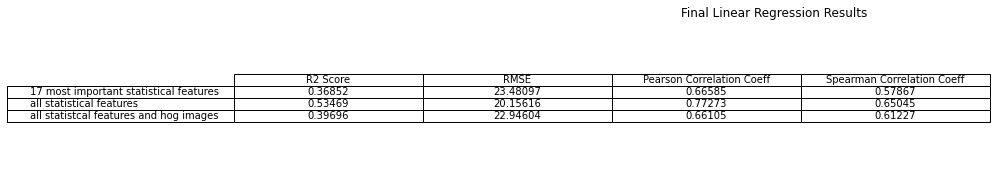

In [5]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,5))
fig.subplots_adjust(left=0.2,top=0.8, wspace=1)

tab= plt.subplot2grid((4,3), (0,0), colspan=2, rowspan=2)
tab.table(cellText=newdata,
          rowLabels=rows,
          cellLoc='center',
          colLabels=columns, loc="upper center")

tab.axis("off")
fig.suptitle('Final Linear Regression Results')
plt.show()

Final Support Vector Regression Results

In [6]:
allstatfeatures = [0.15444161786109023,27.17109785311739,0.42173221172585923,0.6804538692869926]
allstatfeaturesandimages = [0.15333375324800824,27.18889203794151,0.42214891137681654,0.680118297338786]

In [12]:
columns = ('R2 Score','RMSE','Pearson Correlation Coeff','Spearman Correlation Coeff')
rows = ['all statistical features','all statistcal features and hog images']
data = [allstatfeatures,allstatfeaturesandimages]

In [13]:
newdata = []
for d in data:
    newd = [round(float(i), 5) for i in d]
    newdata.append(newd)

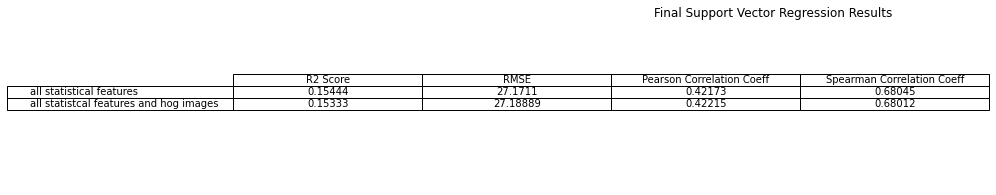

In [14]:
fig = plt.figure(figsize=(25,5))
fig.subplots_adjust(left=0.2,top=0.8, wspace=1)

tab= plt.subplot2grid((4,3), (0,0), colspan=2, rowspan=2)
tab.table(cellText=newdata,
          rowLabels=rows,
          cellLoc='center',
          colLabels=columns, loc="upper center")

tab.axis("off")
fig.suptitle('Final Support Vector Regression Results')
plt.show()

# Question No. 3 (Using Convolutional Neural Networks)

#### a. Use a convolutional neural network (in Keras or PyTorch) to solve this problem in much the same was as in part (ii) of Question (2). You are to develop an architecture of the neural network that takes an image directly as input and produces a count as the output corresponding to T3 cells. You are free to choose any network structure as long as you can show that it gives good performance. Report your results on the test examples by plotting the scatter plot between true and predicted counts on the test data. Also, report your results in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score. You will be evaluated on the design of your machine learning model and final performance metrics. Try to get the best test performance you can. Please include convergence plots in your submission showing how does loss change over training epochs.

Data preprocessing

In [1]:
!pip install tensorflow tensorflow_hub pandas

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 497.6 MB 24.8 MB/s eta 0:00:01    |█████▏                          | 80.4 MB 22.4 MB/s eta 0:00:19     |██████████████▌                 | 224.9 MB 23.6 MB/s eta 0:00:12
     |████████████████████████████████| 108 kB 28.7 MB/s eta 0:00:01
     |████████████████████████████████| 11.7 MB 19.7 MB/s eta 0:00:01
     |████████████████████████████████| 1.4 MB 28.7 MB/s eta 0:00:01
     |████████████████████████████████| 57 kB 59.0 MB/s eta 0:00:01
     |████████████████████████████████| 462 kB 41.1 MB/s eta 0:00:01
     |████████████████████████████████| 14.5 MB 33.3 MB/s eta 0:00:01
     |████████████████████████████████| 5.8 MB 11.6 MB/s eta 0:00:01
     |████████████████████████████████| 80 kB 50.4 MB/s eta 0:00:01
     |████████████████████████████████| 65 kB 33.8 MB/s eta 0:00:01
     |████████████████████████████████| 2.1 MB 28.5 MB/s eta 0:00:01
     |███████████████████████

In [3]:
import numpy as np
import cv2

import PIL.Image as Image
import os

import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras import datasets, layers, models, losses

In [4]:
import numpy as np
import pandas as pd

In [5]:
import sklearn
from sklearn.metrics import mean_squared_error
from scipy.stats import spearmanr

In [6]:
X = np.load("data/images.npy")#read images

In [7]:
Y = pd.read_csv('data/counts.csv')#read cell counts
F = np.loadtxt('data/split.txt')#read fold information

In [8]:
def input_image_fold_designator(images):
    
    fold1_indexes = np.where(F==1)[0]
    fold2_indexes = np.where(F==2)[0]
    fold3_indexes = np.where(F==3)[0]

#     Xtrain = [X[index] for index in fold1_indexes]
#     Xval = [X[index] for index in fold2_indexes]
#     Xtest = [X[index] for index in fold3_indexes]

    X_fold1 = np.array([images[index] for index in fold1_indexes])
    X_fold2 = np.array([images[index] for index in fold2_indexes])
    X_fold3 = np.array([images[index] for index in fold3_indexes])

#     folds = [Xtrain,Xval,Xtest]
    folds_indices = [fold1_indexes,fold2_indexes,fold3_indexes]

    Y_fold1 = Y.iloc[fold1_indexes]
    Y_fold2 = Y.iloc[fold2_indexes]
    Y_fold3 = Y.iloc[fold3_indexes]

    return (X_fold1,X_fold2,X_fold3),(Y_fold1,Y_fold2,Y_fold3),folds_indices

In [9]:
(Xfold1,Xfold2,Xfold3),(Yfold1,Yfold2,Yfold3),folds_indices = input_image_fold_designator(X)

In [10]:
# def image_resizer(img_list,new_size=(224,224)):
#     resized_img_list = []
#     for im in img_list:
#         resized_img_list.append(cv2.resize(im,new_size))
#     return np.array(resized_img_list)

In [11]:
# resizedXfold1 = image_resizer(Xfold1)
# resizedXfold2 = image_resizer(Xfold2)

In [12]:
targetfold1 = np.array(Yfold1['lymphocyte'])/np.max(np.array(Y['lymphocyte']))
targetfold2 = np.array(Yfold2['lymphocyte'])/np.max(np.array(Y['lymphocyte']))
targetfold3 = np.array(Yfold3['lymphocyte'])/np.max(np.array(Y['lymphocyte']))

In [13]:
targetfold1 = (targetfold1 + 0.5)/1.5
targetfold2 = (targetfold2 + 0.5)/1.5
targetfold3 = (targetfold3 + 0.5)/1.5

In [14]:
from scipy import stats

ztargetfold1 = stats.zscore(Yfold1['lymphocyte'])
ztargetfold2 = stats.zscore(Yfold2['lymphocyte'])
ztargetfold3 = stats.zscore(Yfold3['lymphocyte'])

In [15]:
StandardizedXfold1 = tf.image.per_image_standardization(Xfold1)

2022-03-19 22:55:16.932314: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-19 22:55:17.016156: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-19 22:55:17.017450: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-19 22:55:17.021049: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [16]:
# StandardizedResizedXfold1 = tf.image.per_image_standardization(resizedXfold1)
# StandardizedResizedXfold2 = tf.image.per_image_standardization(resizedXfold2)

In [17]:
# Standardizedhfold1 = tf.image.per_image_standardization(hfold1)
# Standardizedhfold2 = tf.image.per_image_standardization(hfold2)

In [18]:
def image_resizer(img_list,new_size=(224,224)):
    resized_img_list = []
    for im in img_list:
        resized_img_list.append(cv2.resize(im,new_size))
    return np.array(resized_img_list)

In [19]:
resizedXfold1 = image_resizer(Xfold1)
resizedXfold2 = image_resizer(Xfold2)
resizedXfold3 = image_resizer(Xfold3)

In [20]:
# resizedhfold1 = image_resizer(hfold1)
# resizedhfold2 = image_resizer(hfold2)

In [21]:
resizednormalizedXfold1, resizednormalizedXfold2, resizednormalizedXfold3 = resizedXfold1/255, resizedXfold2/255, resizedXfold3/255

In [22]:
resizedXfolds = [resizednormalizedXfold1, resizednormalizedXfold2, resizednormalizedXfold3]

Transfer learning

In [23]:
feature_extractor_model = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"

pretrained_model_without_top_layer = hub.KerasLayer(
    feature_extractor_model, input_shape=(224, 224, 3), trainable=False)

In [24]:
# # num_of_cell_types = 450

# model = tf.keras.Sequential([
#     pretrained_model_without_top_layer,
#     tf.keras.layers.Dense(640),
#     tf.keras.layers.BatchNormalization(),
#     tf.keras.layers.LeakyReLU(alpha=0.3),
#     tf.keras.layers.Dropout(0.5),
#     tf.keras.layers.Dense(640),
#     tf.keras.layers.BatchNormalization(),
#     tf.keras.layers.LeakyReLU(alpha=0.3),
#     tf.keras.layers.Dropout(0.5),
#     tf.keras.layers.Dense(1)
# ])

# model.summary()

In [25]:
# learning_rate = 0.0005
# model.compile(
#   optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
#   loss='mean_absolute_error',
#   metrics=['mae'])

In [26]:
# callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5)

# history = model.fit(resizednormalizedXfold1,
#                     targetfold1,
#                     epochs=100,
#                     callbacks=[callback],
#                     validation_data=(resizednormalizedXfold2,targetfold2))

In [27]:
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.title('lr: '+str(learning_rate))
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['loss','val_loss'], loc='upper left')
# plt.show()

In [28]:
# num_of_cell_types = 450

model = tf.keras.Sequential([
    pretrained_model_without_top_layer,
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1)
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 640)               819840    
                                                                 
 batch_normalization (BatchN  (None, 640)              2560      
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 640)               0         
                                                                 
 dropout (Dropout)           (None, 640)               0         
                                                                 
 dense_1 (Dense)             (None, 640)               410240    
                                                        

In [29]:
learning_rate = 0.05
model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
  loss='mean_absolute_error',
  metrics=['mae'])

In [30]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=4)

In [31]:
history = model.fit(resizednormalizedXfold1,
                    targetfold1,
                    epochs=100,
                    callbacks=[callback],
                    validation_data=(resizednormalizedXfold2,targetfold2))

2022-03-19 22:39:51.590149: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 976625664 exceeds 10% of free system memory.
2022-03-19 22:39:52.546002: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 976625664 exceeds 10% of free system memory.


Epoch 1/100


2022-03-19 22:39:58.394725: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8204


51/51 [==============================] - ETA: 0s - loss: 1.7361 - mae: 1.7361

2022-03-19 22:40:03.257224: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1054298112 exceeds 10% of free system memory.
2022-03-19 22:40:04.271799: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 1054298112 exceeds 10% of free system memory.


51/51 [==============================] - 14s 157ms/step - loss: 1.7361 - mae: 1.7361 - val_loss: 1.0251 - val_mae: 1.0251
Epoch 2/100
51/51 [==============================] - 4s 75ms/step - loss: 0.4098 - mae: 0.4098 - val_loss: 0.2777 - val_mae: 0.2777
Epoch 3/100
51/51 [==============================] - 4s 88ms/step - loss: 0.3288 - mae: 0.3288 - val_loss: 0.4114 - val_mae: 0.4114
Epoch 4/100
51/51 [==============================] - 4s 76ms/step - loss: 0.1958 - mae: 0.1958 - val_loss: 0.1060 - val_mae: 0.1060
Epoch 5/100
51/51 [==============================] - 4s 76ms/step - loss: 0.1380 - mae: 0.1380 - val_loss: 0.0855 - val_mae: 0.0855
Epoch 6/100
51/51 [==============================] - 4s 75ms/step - loss: 0.0857 - mae: 0.0857 - val_loss: 0.0379 - val_mae: 0.0379
Epoch 7/100
51/51 [==============================] - 4s 75ms/step - loss: 0.0679 - mae: 0.0679 - val_loss: 0.0478 - val_mae: 0.0478
Epoch 8/100
51/51 [==============================] - 4s 88ms/step - loss: 0.0489 - mae

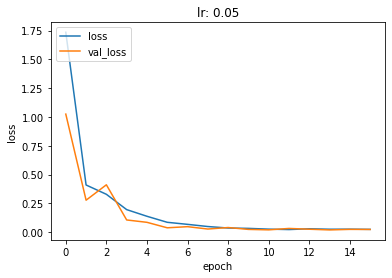

In [32]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('lr: '+str(learning_rate))
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['loss','val_loss'], loc='upper left')
plt.show()

In [33]:
from sklearn.metrics import mean_squared_error
from scipy.stats import spearmanr

In [34]:
y_pred = model.predict(resizednormalizedXfold3)

In [35]:
y_pred

array([[0.34897763],
       [0.34709525],
       [0.3476595 ],
       ...,
       [0.35213503],
       [0.35123357],
       [0.35094088]], dtype=float32)

In [36]:
predicted_counts_fold3 = (1.5*y_pred-0.5)*np.max(Y['lymphocyte'])

In [37]:
predicted_counts_fold3

array([[10.559911],
       [ 9.289294],
       [ 9.670168],
       ...,
       [12.69114 ],
       [12.082654],
       [11.885082]], dtype=float32)

In [38]:
predicted_counts_fold3[predicted_counts_fold3<0] = 0

In [39]:
predicted_counts_fold3

array([[10.559911],
       [ 9.289294],
       [ 9.670168],
       ...,
       [12.69114 ],
       [12.082654],
       [11.885082]], dtype=float32)

In [40]:
predicted_counts_fold3=predicted_counts_fold3.flatten()

RMSE

In [41]:
mean_squared_error(Yfold3['lymphocyte'],predicted_counts_fold3, squared=False)

28.902083248656716

Pearson Correlation Coefficient

In [42]:
np.corrcoef(Yfold3['lymphocyte'],predicted_counts_fold3)[0,1]

0.44278584653358877

Spearman Correlation Coefficient

In [43]:
spearmanr(Yfold3['lymphocyte'],predicted_counts_fold3)

SpearmanrResult(correlation=0.11866554830469231, pvalue=1.8273037463528063e-06)

R2 Score

In [44]:
import sklearn

In [45]:
sklearn.metrics.r2_score(Yfold3['lymphocyte'],predicted_counts_fold3)

0.04327412155730581

Text(0, 0.5, 'Actual lymphocyte count')

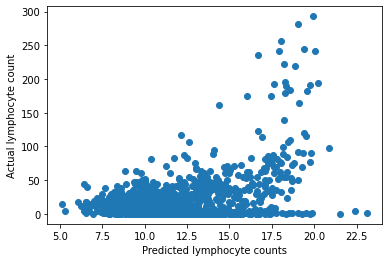

In [49]:
plt.scatter(predicted_counts_fold3,Yfold3['lymphocyte'])
# plt.scatter(np.arange(int(np.max(predicted_counts_fold3))),np.arange(int(np.max(Yfold3['lymphocyte']))),c='red')
plt.xlabel('Predicted lymphocyte counts')
plt.ylabel('Actual lymphocyte count')

#### Final 3.a. CNN Results

In [16]:
results = [0.04327412155730581,28.902083248656716,0.44278584653358877,0.11866554830469231]

In [17]:
columns = ('R2 Score','RMSE','Pearson Correlation Coeff','Spearman Correlation Coeff')
rows = ['Final CNN Design']
data = [results]

In [18]:
newdata = []
for d in data:
    newd = [round(float(i), 5) for i in d]
    newdata.append(newd)

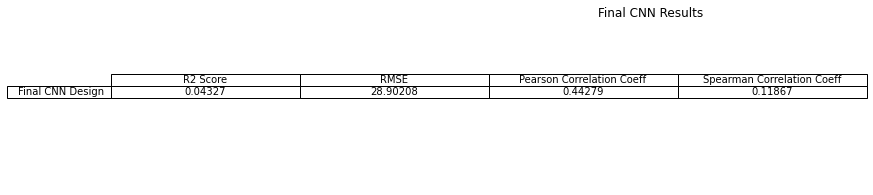

In [20]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,5))
fig.subplots_adjust(left=0.2,top=0.8, wspace=1)

tab= plt.subplot2grid((4,3), (0,0), colspan=2, rowspan=2)
tab.table(cellText=newdata,
          rowLabels=rows,
          cellLoc='center',
          colLabels=columns, loc="upper center")

tab.axis("off")
fig.suptitle('Final CNN Results')
plt.show()

#### b. Use three fold cross validation with your optimal network architecture to predict the counts of T3 cells. Do 3-fold cross-validation with the given folds and report the results for each test fold in the form of separate predicted-vs-actual count scatter plots (3 folds so 3 plots in total) using your model and report your results in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score for each fold separately.

In [ ]:
# Yfolds = [targetfold1,targetfold2,targetfold3]

# for i in range(len(Yfolds)):
#     print('CV: '+str(i+1))

#     keras.backend.clear_session() # clear the previous model
#     Yfoldscopy = Yfolds.copy()
#     resizedXfoldscopy = resizedXfolds.copy()
#     test_target = Yfoldscopy.pop(i)
#     training_targets = np.concatenate(Yfoldscopy)
#     training_indices = [0,1,2].pop(i)
#     testing_fold = resizedXfoldscopy.pop(i)
#     training_folds = np.concatenate(resizedXfoldscopy)
#     # num_of_cell_types = 450

#     model = tf.keras.Sequential([
#         pretrained_model_without_top_layer,
#         tf.keras.layers.Dense(640),
#         tf.keras.layers.BatchNormalization(),
#         tf.keras.layers.LeakyReLU(alpha=0.3),
#         tf.keras.layers.Dropout(0.5),
#         tf.keras.layers.Dense(640),
#         tf.keras.layers.BatchNormalization(),
#         tf.keras.layers.LeakyReLU(alpha=0.3),
#         tf.keras.layers.Dropout(0.5),
#         tf.keras.layers.Dense(1)
#     ])

#     learning_rate = 0.05
#     model.compile(
#       optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
#       loss='mean_absolute_error',
#       metrics=['mae'])

#     history1 = model.fit(training_folds,
#                     training_targets,
#                     epochs=100,
#                     callbacks=[callback],
#                     validation_data=(testing_fold,test_target),
#                     verbose = 0)
#     ##############################################
#     plt.plot(history1.history['loss'])
#     plt.plot(history1.history['val_loss'])
#     plt.title('lr: '+str(learning_rate))
#     plt.ylabel('loss')
#     plt.xlabel('epoch')
#     plt.legend(['loss','val_loss'], loc='upper left')
#     plt.show()
#     ##############################################
#     y_pred = model.predict(testing_fold)
#     predicted_counts_fold3 = (1.5*y_pred-0.5)*np.max(Y['lymphocyte'])
#     predicted_counts_fold3[predicted_counts_fold3<0] = 0
#     predicted_counts_fold3=predicted_counts_fold3.flatten()
#     print('RMSE: '+str(mean_squared_error(test_target,predicted_counts_fold3, squared=False)))
#     print('PCC: '+str(np.corrcoef(test_target,predicted_counts_fold3)[0,1]))
#     print('SCC: '+str(spearmanr(test_target,predicted_counts_fold3)))
#     print('R2: '+str(sklearn.metrics.r2_score(test_target,predicted_counts_fold3)))

Trying to loop caused the kernel to continuously crash

CV: 1


2022-03-19 22:47:35.181405: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8204


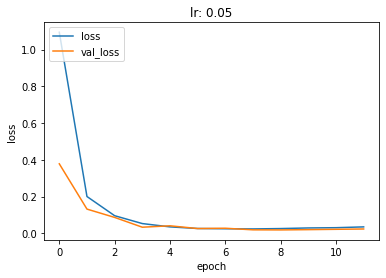

RMSE: 22.05069660186432
PCC: 0.648291803056293
SCC: SpearmanrResult(correlation=0.7549335938406074, pvalue=3.890678037205187e-299)
R2: 0.41166581201977337
[23.897972 23.827538 21.907425 ... 31.618818 38.46792  38.262276]
136      4
137      2
138     14
139      7
140      0
        ..
4840    23
4841    29
4842    17
4843    28
4844    28
Name: lymphocyte, Length: 1622, dtype: int64


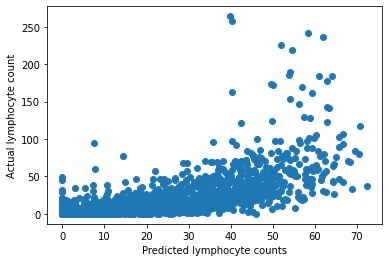

In [29]:
Yfolds = [targetfold1,targetfold2,targetfold3]
unmodified_Yfolds = [Yfold1['lymphocyte'],Yfold2['lymphocyte'],Yfold3['lymphocyte']]

i = 0
print('CV: '+str(i+1))

keras.backend.clear_session() # clear the previous model
Yfoldscopy = Yfolds.copy()
resizedXfoldscopy = resizedXfolds.copy()
test_target = Yfoldscopy.pop(i)
unmodified_Yfold = unmodified_Yfolds.pop(i)
training_targets = np.concatenate(Yfoldscopy)
training_indices = [0,1,2].pop(i)
testing_fold = resizedXfoldscopy.pop(i)
training_folds = np.concatenate(resizedXfoldscopy)
# num_of_cell_types = 450

model = tf.keras.Sequential([
    pretrained_model_without_top_layer,
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1)
])

learning_rate = 0.05
model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
  loss='mean_absolute_error',
  metrics=['mae'])

history1 = model.fit(training_folds,
                training_targets,
                epochs=100,
                callbacks=[callback],
                validation_data=(testing_fold,test_target),
                verbose = 0)
##############################################
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('lr: '+str(learning_rate))
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['loss','val_loss'], loc='upper left')
plt.show()
##############################################
y_pred = model.predict(testing_fold)
predicted_counts_fold3 = (1.5*y_pred-0.5)*np.max(Y['lymphocyte'])
predicted_counts_fold3[predicted_counts_fold3<0] = 0
predicted_counts_fold3=predicted_counts_fold3.flatten()
print('RMSE: '+str(mean_squared_error(unmodified_Yfold,predicted_counts_fold3, squared=False)))
print('PCC: '+str(np.corrcoef(unmodified_Yfold,predicted_counts_fold3)[0,1]))
print('SCC: '+str(spearmanr(unmodified_Yfold,predicted_counts_fold3)))
print('R2: '+str(sklearn.metrics.r2_score(unmodified_Yfold,predicted_counts_fold3)))
################################################################
print(predicted_counts_fold3)
print(unmodified_Yfold)
plt.scatter(predicted_counts_fold3,unmodified_Yfold)
plt.xlabel('Predicted lymphocyte counts')
plt.ylabel('Actual lymphocyte count')
plt.show()
##############################################

CV: 2


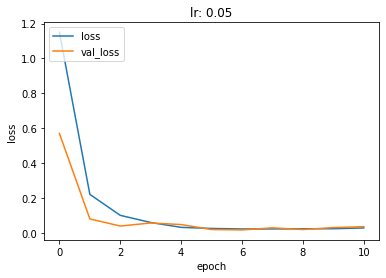

RMSE: 30.75893615451043
PCC: 0.5622256248618744
SCC: SpearmanrResult(correlation=0.45264992070463445, pvalue=3.519100210870103e-89)
R2: 0.12837334665538758
[0. 0. 0. ... 0. 0. 0.]
280     30
281     31
282     24
283      4
284      4
        ..
4864     2
4865     1
4866     1
4867     1
4868     1
Name: lymphocyte, Length: 1751, dtype: int64


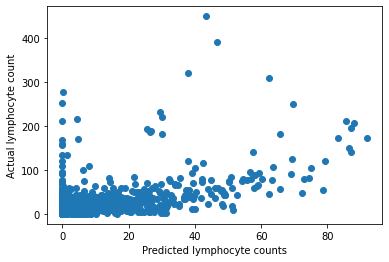

In [30]:
Yfolds = [targetfold1,targetfold2,targetfold3]
unmodified_Yfolds = [Yfold1['lymphocyte'],Yfold2['lymphocyte'],Yfold3['lymphocyte']]

i = 1
print('CV: '+str(i+1))

keras.backend.clear_session() # clear the previous model
Yfoldscopy = Yfolds.copy()
resizedXfoldscopy = resizedXfolds.copy()
test_target = Yfoldscopy.pop(i)
unmodified_Yfold = unmodified_Yfolds.pop(i)
training_targets = np.concatenate(Yfoldscopy)
training_indices = [0,1,2].pop(i)
testing_fold = resizedXfoldscopy.pop(i)
training_folds = np.concatenate(resizedXfoldscopy)
# num_of_cell_types = 450

model = tf.keras.Sequential([
    pretrained_model_without_top_layer,
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1)
])

learning_rate = 0.05
model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
  loss='mean_absolute_error',
  metrics=['mae'])

history1 = model.fit(training_folds,
                training_targets,
                epochs=100,
                callbacks=[callback],
                validation_data=(testing_fold,test_target),
                verbose = 0)
##############################################
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('lr: '+str(learning_rate))
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['loss','val_loss'], loc='upper left')
plt.show()
##############################################
y_pred = model.predict(testing_fold)
predicted_counts_fold3 = (1.5*y_pred-0.5)*np.max(Y['lymphocyte'])
predicted_counts_fold3[predicted_counts_fold3<0] = 0
predicted_counts_fold3=predicted_counts_fold3.flatten()
print('RMSE: '+str(mean_squared_error(unmodified_Yfold,predicted_counts_fold3, squared=False)))
print('PCC: '+str(np.corrcoef(unmodified_Yfold,predicted_counts_fold3)[0,1]))
print('SCC: '+str(spearmanr(unmodified_Yfold,predicted_counts_fold3)))
print('R2: '+str(sklearn.metrics.r2_score(unmodified_Yfold,predicted_counts_fold3)))
################################################################
print(predicted_counts_fold3)
print(unmodified_Yfold)
plt.scatter(predicted_counts_fold3,unmodified_Yfold)
plt.xlabel('Predicted lymphocyte counts')
plt.ylabel('Actual lymphocyte count')
plt.show()
##############################################

CV: 3


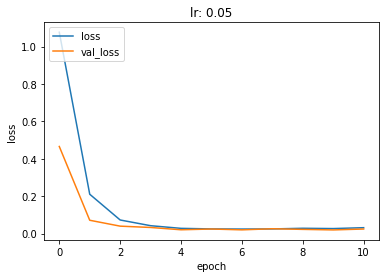

RMSE: 22.999411275929305
PCC: 0.6735845318724953
SCC: SpearmanrResult(correlation=0.5498050356456714, pvalue=1.0748883707393375e-127)
R2: 0.39415341417151706
[0.         0.         4.948461   ... 0.17445087 0.         0.        ]
0        0
1        1
2        3
3        0
4        7
        ..
4976    17
4977     9
4978     1
4979     8
4980     3
Name: lymphocyte, Length: 1608, dtype: int64


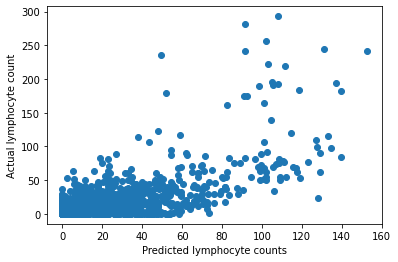

In [31]:
Yfolds = [targetfold1,targetfold2,targetfold3]
unmodified_Yfolds = [Yfold1['lymphocyte'],Yfold2['lymphocyte'],Yfold3['lymphocyte']]

i = 2
print('CV: '+str(i+1))

keras.backend.clear_session() # clear the previous model
Yfoldscopy = Yfolds.copy()
resizedXfoldscopy = resizedXfolds.copy()
test_target = Yfoldscopy.pop(i)
unmodified_Yfold = unmodified_Yfolds.pop(i)
training_targets = np.concatenate(Yfoldscopy)
training_indices = [0,1,2].pop(i)
testing_fold = resizedXfoldscopy.pop(i)
training_folds = np.concatenate(resizedXfoldscopy)
# num_of_cell_types = 450

model = tf.keras.Sequential([
    pretrained_model_without_top_layer,
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1)
])

learning_rate = 0.05
model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
  loss='mean_absolute_error',
  metrics=['mae'])

history1 = model.fit(training_folds,
                training_targets,
                epochs=100,
                callbacks=[callback],
                validation_data=(testing_fold,test_target),
                verbose = 0)
##############################################
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('lr: '+str(learning_rate))
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['loss','val_loss'], loc='upper left')
plt.show()
##############################################
y_pred = model.predict(testing_fold)
predicted_counts_fold3 = (1.5*y_pred-0.5)*np.max(Y['lymphocyte'])
predicted_counts_fold3[predicted_counts_fold3<0] = 0
predicted_counts_fold3=predicted_counts_fold3.flatten()
print('RMSE: '+str(mean_squared_error(unmodified_Yfold,predicted_counts_fold3, squared=False)))
print('PCC: '+str(np.corrcoef(unmodified_Yfold,predicted_counts_fold3)[0,1]))
print('SCC: '+str(spearmanr(unmodified_Yfold,predicted_counts_fold3)))
print('R2: '+str(sklearn.metrics.r2_score(unmodified_Yfold,predicted_counts_fold3)))
################################################################
print(predicted_counts_fold3)
print(unmodified_Yfold)
plt.scatter(predicted_counts_fold3,unmodified_Yfold)
plt.xlabel('Predicted lymphocyte counts')
plt.ylabel('Actual lymphocyte count')
plt.show()
##############################################

#### Final 3.b. CNN cross validation results

In [32]:
cv1 = [0.41166581201977337,22.05069660186432,0.648291803056293,0.7549335938406074]
cv2 = [0.12837334665538758,30.75893615451043,0.5622256248618744,0.45264992070463445]
cv3 = [0.39415341417151706,22.999411275929305,0.6735845318724953,0.5498050356456714]

In [33]:
columns = ('R2 Score','RMSE','Pearson Correlation Coeff','Spearman Correlation Coeff')
rows = ['Cross Validated Fold1','Cross Validated Fold2','Cross Validated Fold3']
data = [cv1,cv2,cv3]

In [34]:
newdata = []
for d in data:
    newd = [round(float(i), 5) for i in d]
    newdata.append(newd)

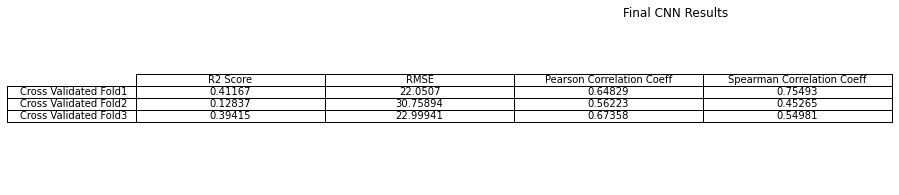

In [35]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,5))
fig.subplots_adjust(left=0.2,top=0.8, wspace=1)

tab= plt.subplot2grid((4,3), (0,0), colspan=2, rowspan=2)
tab.table(cellText=newdata,
          rowLabels=rows,
          cellLoc='center',
          colLabels=columns, loc="upper center")

tab.axis("off")
fig.suptitle('Final CNN Results')
plt.show()

#### c. Use a convolutional neural network (in Keras or Pytorch) to predict the counts of 6 types of cells simultaneously given the image patch as input and perform 3-fold cross-validation using the given folds. You are free to choose any network structure as long as you can show that it gives good cross-validation performance. Do 3-fold cross-validation using the specified folds and report the results for each test fold for each cell type in the form of separate predictedvs-actual count scatter plots (3 folds, 6 cell types so 18 plots in total) using your optimal machine learning model and report your results in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score for each cell type and each fold separately along with the average of each cell type across the 3 folds.

CV: 1


2022-03-19 22:47:35.181405: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8204


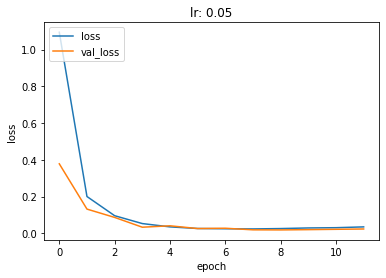

RMSE: 22.05069660186432
PCC: 0.648291803056293
SCC: SpearmanrResult(correlation=0.7549335938406074, pvalue=3.890678037205187e-299)
R2: 0.41166581201977337
[23.897972 23.827538 21.907425 ... 31.618818 38.46792  38.262276]
136      4
137      2
138     14
139      7
140      0
        ..
4840    23
4841    29
4842    17
4843    28
4844    28
Name: lymphocyte, Length: 1622, dtype: int64


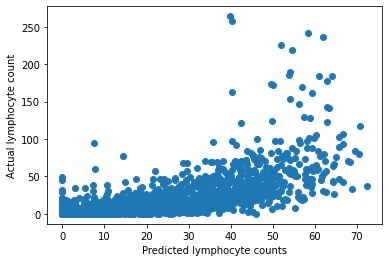

In [29]:
Yfolds = [targetfold1,targetfold2,targetfold3]
unmodified_Yfolds = [Yfold1['lymphocyte'],Yfold2['lymphocyte'],Yfold3['lymphocyte']]

i = 0
print('CV: '+str(i+1))

keras.backend.clear_session() # clear the previous model
Yfoldscopy = Yfolds.copy()
resizedXfoldscopy = resizedXfolds.copy()
test_target = Yfoldscopy.pop(i)
unmodified_Yfold = unmodified_Yfolds.pop(i)
training_targets = np.concatenate(Yfoldscopy)
training_indices = [0,1,2].pop(i)
testing_fold = resizedXfoldscopy.pop(i)
training_folds = np.concatenate(resizedXfoldscopy)
# num_of_cell_types = 450

model = tf.keras.Sequential([
    pretrained_model_without_top_layer,
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(640),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(alpha=0.3),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(1)
])

learning_rate = 0.05
model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
  loss='mean_absolute_error',
  metrics=['mae'])

history1 = model.fit(training_folds,
                training_targets,
                epochs=100,
                callbacks=[callback],
                validation_data=(testing_fold,test_target),
                verbose = 0)
##############################################
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('lr: '+str(learning_rate))
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['loss','val_loss'], loc='upper left')
plt.show()
##############################################
y_pred = model.predict(testing_fold)
predicted_counts_fold3 = (1.5*y_pred-0.5)*np.max(Y['lymphocyte'])
predicted_counts_fold3[predicted_counts_fold3<0] = 0
predicted_counts_fold3=predicted_counts_fold3.flatten()
print('RMSE: '+str(mean_squared_error(unmodified_Yfold,predicted_counts_fold3, squared=False)))
print('PCC: '+str(np.corrcoef(unmodified_Yfold,predicted_counts_fold3)[0,1]))
print('SCC: '+str(spearmanr(unmodified_Yfold,predicted_counts_fold3)))
print('R2: '+str(sklearn.metrics.r2_score(unmodified_Yfold,predicted_counts_fold3)))
################################################################
print(predicted_counts_fold3)
print(unmodified_Yfold)
plt.scatter(predicted_counts_fold3,unmodified_Yfold)
plt.xlabel('Predicted lymphocyte counts')
plt.ylabel('Actual lymphocyte count')
plt.show()
##############################################

In [30]:
# def plot_cnn_info(i,cell_type):
#     targetfold1 = (np.array(Yfold1[cell_type])/np.max(np.array(Y[cell_type])) + 0.5)/1.5
#     targetfold2 = (np.array(Yfold2[cell_type])/np.max(np.array(Y[cell_type])) + 0.5)/1.5
#     targetfold3 = (np.array(Yfold3[cell_type])/np.max(np.array(Y[cell_type])) + 0.5)/1.5
#     Yfolds = [targetfold1,targetfold2,targetfold3]
#     print('CV: '+str(i+1)+'; cell type: '+str(cell_type))

# #     keras.backend.clear_session() # clear the previous model
#     Yfoldscopy = Yfolds.copy()
#     resizedXfoldscopy = resizedXfolds.copy()
#     test_target = Yfoldscopy.pop(i)
#     training_targets = np.concatenate(Yfoldscopy)
#     training_indices = [0,1,2].pop(i)
#     testing_fold = resizedXfoldscopy.pop(i)
#     training_folds = np.concatenate(resizedXfoldscopy)
#     # num_of_cell_types = 450

#     model = tf.keras.Sequential([
#         pretrained_model_without_top_layer,
#         tf.keras.layers.Dense(640),
#         tf.keras.layers.BatchNormalization(),
#         tf.keras.layers.LeakyReLU(alpha=0.3),
#         tf.keras.layers.Dropout(0.5),
#         tf.keras.layers.Dense(640),
#         tf.keras.layers.BatchNormalization(),
#         tf.keras.layers.LeakyReLU(alpha=0.3),
#         tf.keras.layers.Dropout(0.5),
#         tf.keras.layers.Dense(1)
#     ])

#     learning_rate = 0.05
#     model.compile(
#       optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
#       loss='mean_absolute_error',
#       metrics=['mae'])

#     history1 = model.fit(training_folds,
#                     training_targets,
#                     epochs=100,
#                     callbacks=[callback],
#                     validation_data=(testing_fold,test_target),
#                     verbose = 0)
#     ##############################################
#     plt.plot(history1.history['loss'])
#     plt.plot(history1.history['val_loss'])
#     plt.title('lr: '+str(learning_rate))
#     plt.ylabel('loss')
#     plt.xlabel('epoch')
#     plt.legend(['loss','val_loss'], loc='upper left')
#     plt.show()
#     ##############################################
#     y_pred = model.predict(testing_fold)
#     predicted_counts_fold3 = (1.5*y_pred-0.5)*np.max(Y['lymphocyte'])
#     predicted_counts_fold3[predicted_counts_fold3<0] = 0
#     predicted_counts_fold3=predicted_counts_fold3.flatten()
#     test_target = test_target.flatten()
#     print('RMSE: '+str(mean_squared_error(test_target,predicted_counts_fold3, squared=False)))
#     print('PCC: '+str(np.corrcoef(test_target,predicted_counts_fold3)[0,1]))
#     print('SCC: '+str(spearmanr(test_target,predicted_counts_fold3)))
#     print('R2: '+str(sklearn.metrics.r2_score(test_target,predicted_counts_fold3)))

In [31]:
def plot_cnn_info(i,cell_type):
    targetfold1 = (np.array(Yfold1[cell_type])/np.max(np.array(Y[cell_type])) + 0.5)/1.5
    targetfold2 = (np.array(Yfold2[cell_type])/np.max(np.array(Y[cell_type])) + 0.5)/1.5
    targetfold3 = (np.array(Yfold3[cell_type])/np.max(np.array(Y[cell_type])) + 0.5)/1.5
    Yfolds = [targetfold1,targetfold2,targetfold3]
    print('CV: '+str(i+1)+'; cell type: '+str(cell_type))

    Yfolds = [targetfold1,targetfold2,targetfold3]
    unmodified_Yfolds = [Yfold1['lymphocyte'],Yfold2['lymphocyte'],Yfold3['lymphocyte']]

    keras.backend.clear_session() # clear the previous model
    Yfoldscopy = Yfolds.copy()
    resizedXfoldscopy = resizedXfolds.copy()
    test_target = Yfoldscopy.pop(i)
    unmodified_Yfold = unmodified_Yfolds.pop(i)
    training_targets = np.concatenate(Yfoldscopy)
    training_indices = [0,1,2].pop(i)
    testing_fold = resizedXfoldscopy.pop(i)
    training_folds = np.concatenate(resizedXfoldscopy)
    # num_of_cell_types = 450

    model = tf.keras.Sequential([
        pretrained_model_without_top_layer,
        tf.keras.layers.Dense(640),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(alpha=0.3),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(640),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(alpha=0.3),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1)
    ])

    learning_rate = 0.05
    model.compile(
      optimizer=tf.keras.optimizers.Adam(learning_rate = learning_rate),
      loss='mean_absolute_error',
      metrics=['mae'])

    history1 = model.fit(training_folds,
                    training_targets,
                    epochs=100,
                    callbacks=[callback],
                    validation_data=(testing_fold,test_target),
                    verbose = 0)
    ##############################################
    plt.plot(history1.history['loss'])
    plt.plot(history1.history['val_loss'])
    plt.title('lr: '+str(learning_rate))
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['loss','val_loss'], loc='upper left')
    plt.show()
    ##############################################
    y_pred = model.predict(testing_fold)
    predicted_counts_fold3 = (1.5*y_pred-0.5)*np.max(Y['lymphocyte'])
    predicted_counts_fold3[predicted_counts_fold3<0] = 0
    predicted_counts_fold3=predicted_counts_fold3.flatten()
    print('RMSE: '+str(mean_squared_error(unmodified_Yfold,predicted_counts_fold3, squared=False)))
    print('PCC: '+str(np.corrcoef(unmodified_Yfold,predicted_counts_fold3)[0,1]))
    print('SCC: '+str(spearmanr(unmodified_Yfold,predicted_counts_fold3)))
    print('R2: '+str(sklearn.metrics.r2_score(unmodified_Yfold,predicted_counts_fold3)))
    ################################################################
    print(predicted_counts_fold3)
    print(np.array(unmodified_Yfold))
    plt.scatter(predicted_counts_fold3,unmodified_Yfold)
    plt.xlabel('Predicted lymphocyte counts')
    plt.ylabel('Actual lymphocyte count')
    plt.show()
    ##############################################

CV: 1; cell type: ['neutrophil']


2022-03-19 22:55:45.634790: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8204


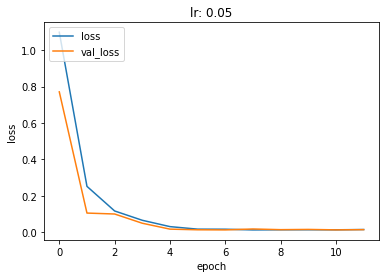

RMSE: 34.99837117953997
PCC: -0.34892794846819325
SCC: SpearmanrResult(correlation=-0.6141081831281243, pvalue=9.353590566346504e-169)
R2: -0.4820918664366489
[0.         0.637722   0.26655793 ... 0.         0.         0.        ]
[ 4  2 14 ... 17 28 28]


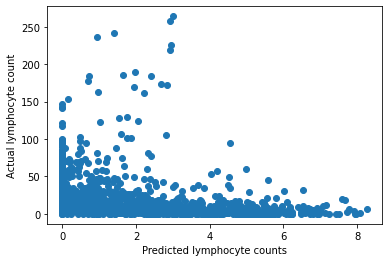

In [32]:
plot_cnn_info(0,['neutrophil'])

CV: 2; cell type: ['neutrophil']


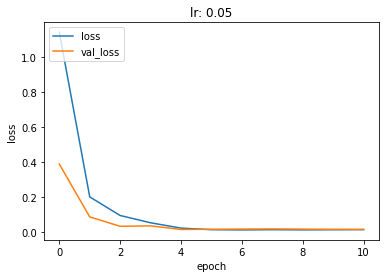

RMSE: 34.52507517552868
PCC: 0.5075960209102521
SCC: SpearmanrResult(correlation=0.31216971012060996, pvalue=6.973987665500789e-41)
R2: -0.09813857237344736
[4.6199174 3.6256762 3.6987126 ... 4.6409187 2.821201  3.1850696]
[30 31 24 ...  1  1  1]


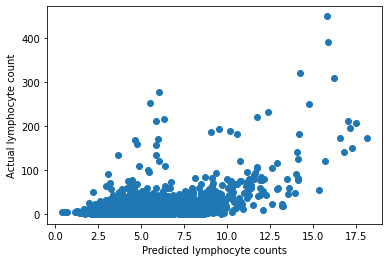

In [33]:
plot_cnn_info(1,['neutrophil'])

CV: 3; cell type: ['neutrophil']


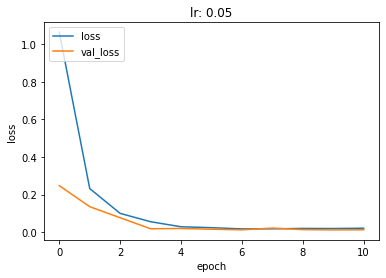

RMSE: 33.874678184397105
PCC: -0.012965015284962883
SCC: SpearmanrResult(correlation=0.09293014524093632, pvalue=0.00019021695486680961)
R2: -0.3142548311149258
[0. 0. 0. ... 0. 0. 0.]
[0 1 3 ... 1 8 3]


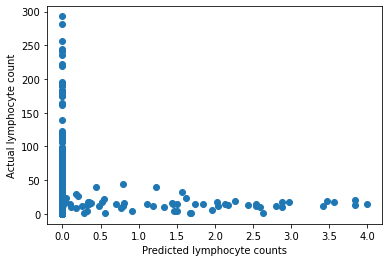

In [34]:
plot_cnn_info(2,['neutrophil'])

CV: 1; cell type: ['epithelial']


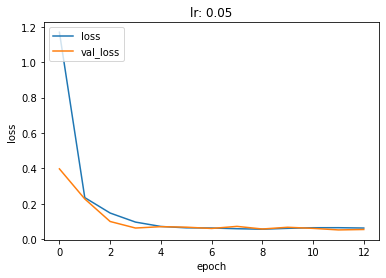

RMSE: 78.47731045468181
PCC: 0.10094383118299317
SCC: SpearmanrResult(correlation=0.2773283198340369, pvalue=4.991861507843599e-30)
R2: -6.451911347314421
[114.83481  145.51976  108.80172  ...  32.732204 127.46286   96.26352 ]
[ 4  2 14 ... 17 28 28]


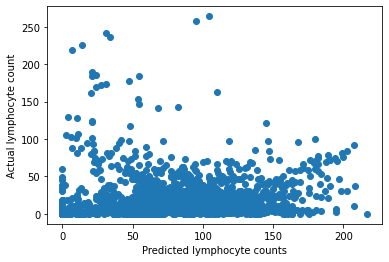

In [35]:
plot_cnn_info(0,['epithelial'])

CV: 2; cell type: ['epithelial']


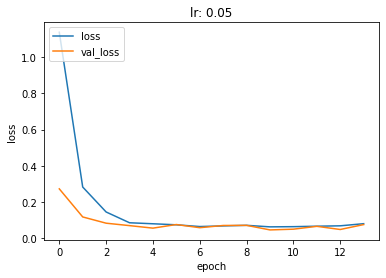

RMSE: 115.83244175083725
PCC: 0.11082911568049816
SCC: SpearmanrResult(correlation=0.19213464338054204, pvalue=5.070562526716609e-16)
R2: -11.360849067154577
[143.15129 157.23546 159.37192 ... 180.07391 190.27661 177.52133]
[30 31 24 ...  1  1  1]


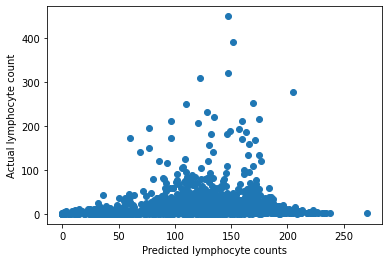

In [36]:
plot_cnn_info(1,['epithelial'])

CV: 3; cell type: ['epithelial']


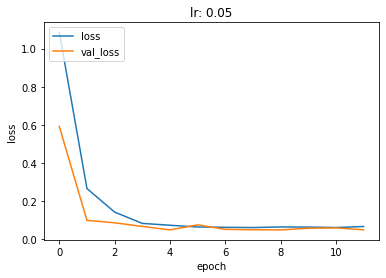

RMSE: 68.2615110314022
PCC: -0.017425411616962493
SCC: SpearmanrResult(correlation=0.14622461679262233, pvalue=3.845218805512702e-09)
R2: -4.3368011495903644
[ 85.85649 107.6993  171.17247 ... 159.8206  111.78932 137.94255]
[0 1 3 ... 1 8 3]


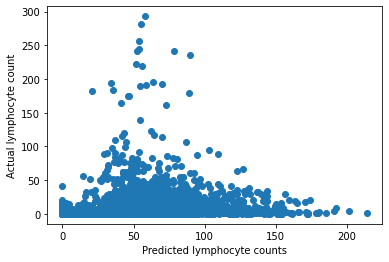

In [37]:
plot_cnn_info(2,['epithelial'])

CV: 1; cell type: ['lymphocyte']


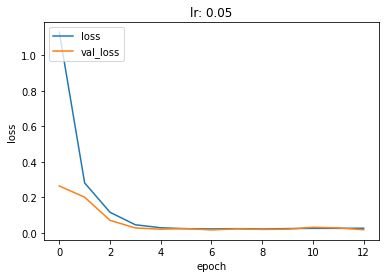

RMSE: 23.29651201326407
PCC: 0.6223525158269478
SCC: SpearmanrResult(correlation=0.7264445065751192, pvalue=3.436414087652476e-266)
R2: 0.34330869842191014
[16.708553 11.985263 18.117302 ... 18.786325 28.141684 28.918371]
[ 4  2 14 ... 17 28 28]


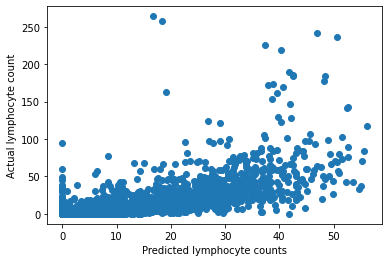

In [38]:
plot_cnn_info(0,['lymphocyte'])

CV: 2; cell type: ['lymphocyte']


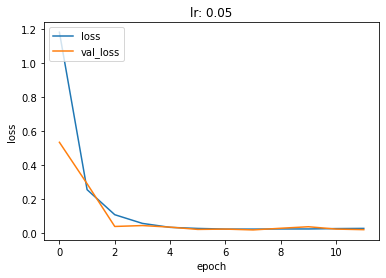

RMSE: 28.211300429438005
PCC: 0.543554343284664
SCC: SpearmanrResult(correlation=0.7132667024278756, pvalue=2.961803022037568e-272)
R2: 0.2667803548866724
[18.850834 20.197195 17.271065 ... 20.0703   22.313564 21.8894  ]
[30 31 24 ...  1  1  1]


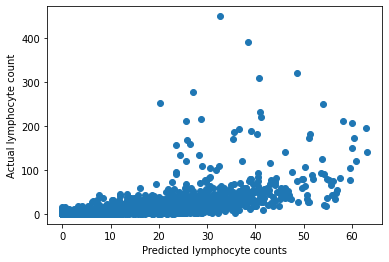

In [39]:
plot_cnn_info(1,['lymphocyte'])

CV: 3; cell type: ['lymphocyte']


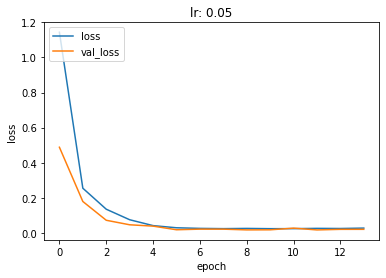

RMSE: 23.271715193370007
PCC: 0.6430320808074673
SCC: SpearmanrResult(correlation=0.749582795189324, pvalue=4.243225030121854e-290)
R2: 0.37972252179274213
[ 8.13868    8.778709  13.688225  ...  6.5075216 11.381472   5.2505584]
[0 1 3 ... 1 8 3]


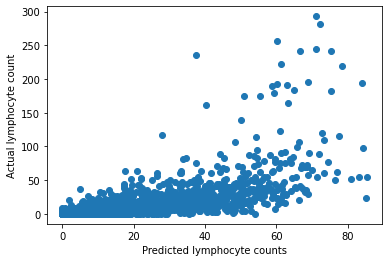

In [40]:
plot_cnn_info(2,['lymphocyte'])

CV: 1; cell type: ['plasma']


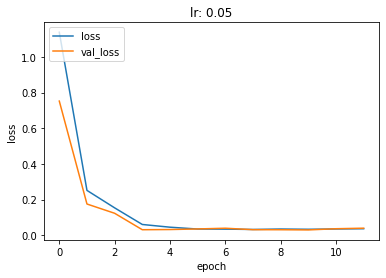

RMSE: 27.71761698911129
PCC: 0.41766660182955245
SCC: SpearmanrResult(correlation=0.44967315445920447, pvalue=1.4952460442881384e-81)
R2: 0.07041044169844612
[27.745762 28.411192 34.43798  ... 42.535572 39.189674 43.58547 ]
[ 4  2 14 ... 17 28 28]


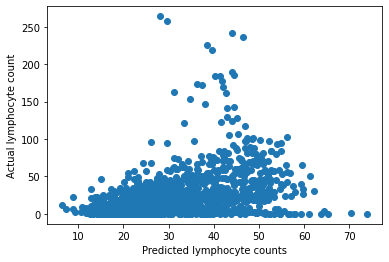

In [41]:
plot_cnn_info(0,['plasma'])

CV: 2; cell type: ['plasma']


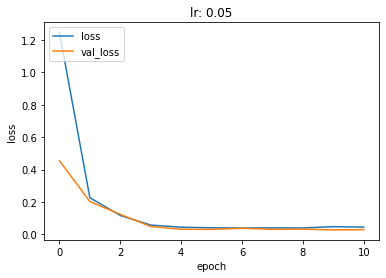

RMSE: 31.063628337817587
PCC: 0.3362189089276912
SCC: SpearmanrResult(correlation=0.5505095021472003, pvalue=2.588995030501406e-139)
R2: 0.11101948184851007
[21.441364 13.833493 10.464155 ...  0.        9.021878 10.681736]
[30 31 24 ...  1  1  1]


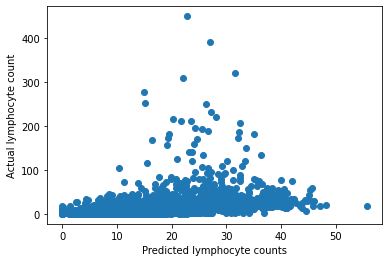

In [42]:
plot_cnn_info(1,['plasma'])

CV: 3; cell type: ['plasma']


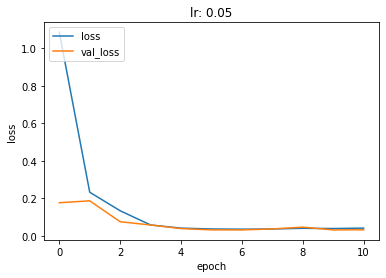

RMSE: 28.9752694876338
PCC: 0.39171374667118025
SCC: SpearmanrResult(correlation=0.5568745800987803, pvalue=1.2394180840872531e-131)
R2: 0.038422718984933324
[0.         1.0912567  0.47126412 ... 2.715683   0.         0.        ]
[0 1 3 ... 1 8 3]


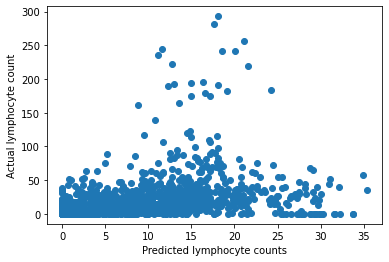

In [43]:
plot_cnn_info(2,['plasma'])

CV: 1; cell type: ['eosinophil']


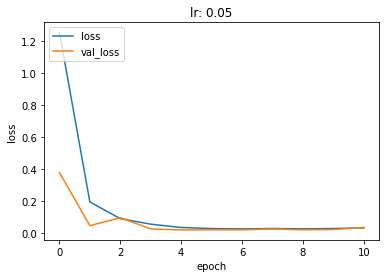

RMSE: 35.41843999903256
PCC: -0.1090264627881997
SCC: SpearmanrResult(correlation=-0.18397602088024292, pvalue=8.168485785402646e-14)
R2: -0.5178830663724139
[0. 0. 0. ... 0. 0. 0.]
[ 4  2 14 ... 17 28 28]


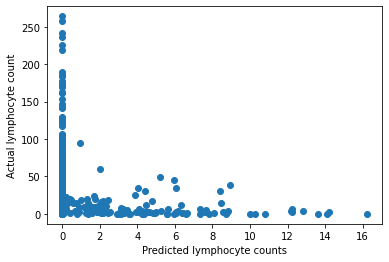

In [44]:
plot_cnn_info(0,['eosinophil'])

CV: 2; cell type: ['eosinophil']


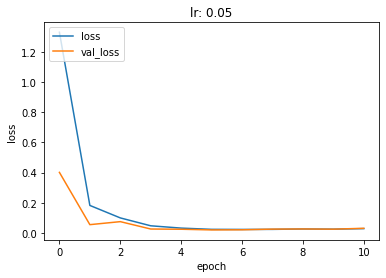

RMSE: 32.08798685605067
PCC: 0.3987127494061832
SCC: SpearmanrResult(correlation=0.6497562334351508, pvalue=1.4220580469134826e-210)
R2: 0.05142249173204427
[ 6.5394135 14.577699   0.        ...  0.         0.         0.       ]
[30 31 24 ...  1  1  1]


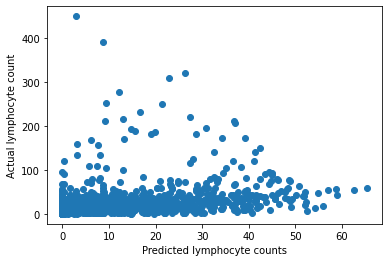

In [45]:
plot_cnn_info(1,['eosinophil'])

CV: 3; cell type: ['eosinophil']


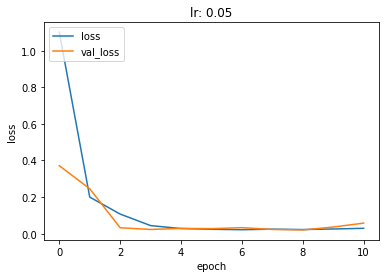

RMSE: 42.95629701165283
PCC: -0.39582827163825723
SCC: SpearmanrResult(correlation=-0.6488459003148354, pvalue=8.256013784885416e-193)
R2: -1.113405820517984
[51.138462 42.120605 34.970882 ... 48.08042  54.131752 40.521366]
[0 1 3 ... 1 8 3]


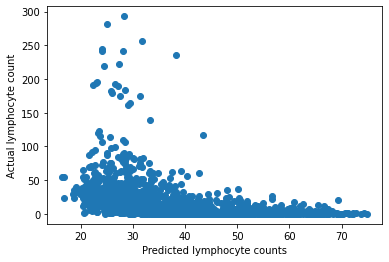

In [46]:
plot_cnn_info(2,['eosinophil'])

CV: 1; cell type: ['connective']


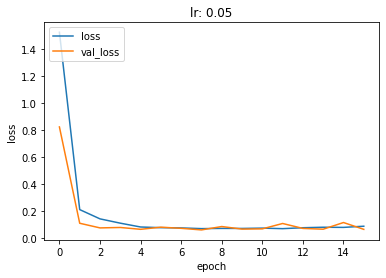

RMSE: 102.36910779514315
PCC: 0.4112977097658207
SCC: SpearmanrResult(correlation=0.5130336325913026, pvalue=1.373214381336387e-109)
R2: -11.679942807482604
[100.58957  93.92294 107.07936 ... 190.24753 146.6173  138.03065]
[ 4  2 14 ... 17 28 28]


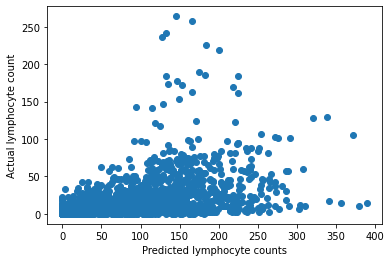

In [47]:
plot_cnn_info(0,['connective'])

CV: 2; cell type: ['connective']


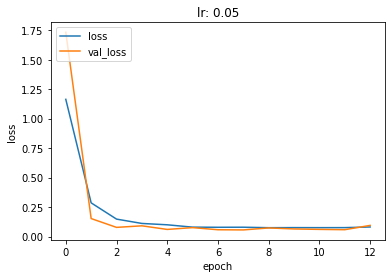

RMSE: 129.99394916936714
PCC: 0.011527963874578306
SCC: SpearmanrResult(correlation=-0.07539373899232209, pvalue=0.001593529555586281)
R2: -14.568047788208249
[ 76.85315  93.94601  91.77189 ... 203.06956 110.34227 104.0832 ]
[30 31 24 ...  1  1  1]


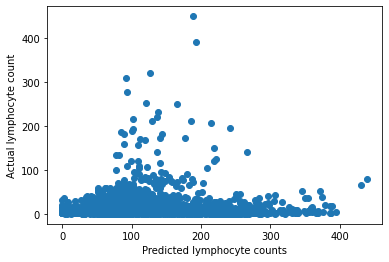

In [48]:
plot_cnn_info(1,['connective'])

CV: 3; cell type: ['connective']


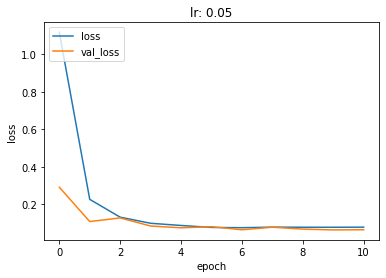

RMSE: 66.5548561739642
PCC: 0.38388413868964155
SCC: SpearmanrResult(correlation=0.4623595087636867, pvalue=5.70911319112078e-86)
R2: -4.073278743241265
[45.048157 41.62842  54.393967 ... 42.501183 37.775936 50.80576 ]
[0 1 3 ... 1 8 3]


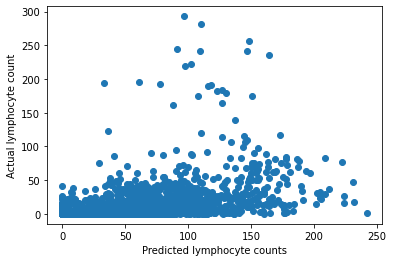

In [49]:
plot_cnn_info(2,['connective'])

#### Final 3.c. CNN cross validation results on all cell_types

In [36]:
cv1neutrophil = [-0.4820918664366489,34.99837117953997,-0.34892794846819325,-0.6141081831281243]
cv2neutrophil = [-0.09813857237344736,34.52507517552868,0.5075960209102521,0.31216971012060996]
cv3neutrophil = [-0.3142548311149258,33.874678184397105,-0.012965015284962883,0.09293014524093632]
cv1epithelial = [-6.451911347314421,78.47731045468181,0.10094383118299317,0.2773283198340369]
cv2epithelial = [-11.360849067154577,115.83244175083725,0.11082911568049816,0.19213464338054204]
cv3epithelial = [-4.3368011495903644,68.2615110314022,0.017425411616962493,0.14622461679262233]
cv1lymphocyte = [0.34330869842191014,23.29651201326407,0.6223525158269478,0.7264445065751192]
cv2lymphocyte = [0.2667803548866724,28.211300429438005,0.543554343284664,0.7132667024278756]
cv3lymphocyte = [0.37972252179274213,23.271715193370007,0.6430320808074673,0.749582795189324]
cv1plasma = [0.07041044169844612,27.71761698911129,0.41766660182955245,0.44967315445920447]
cv2plasma = [0.11101948184851007,31.063628337817587,0.3362189089276912,0.5505095021472003]
cv3plasma = [0.038422718984933324,28.9752694876338,0.39171374667118025,0.5568745800987803]
cv1eosinophil = [-0.5178830663724139,35.41843999903256,-0.1090264627881997,-0.18397602088024292]
cv2eosinophil = [0.05142249173204427,32.08798685605067,0.3987127494061832,0.6497562334351508]
cv3eosinophil = [-1.113405820517984,42.95629701165283,-0.39582827163825723,-0.6488459003148354]
cv1connective = [-11.679942807482604,102.36910779514315,0.4112977097658207,0.5130336325913026]
cv2connective = [-14.568047788208249,129.99394916936714,0.011527963874578306,-0.07539373899232209]
cv3connective = [-4.073278743241265,66.5548561739642,0.38388413868964155,0.4623595087636867]


In [37]:
columns = ('R2 Score','RMSE','Pearson Correlation Coeff','Spearman Correlation Coeff')
rows = ['CV 1: neutrophil','CV 2: neutrophil','CV 3: neutrophil','CV 1: epithelial','CV 2: epithelial','CV 3: epithelial','CV 1: lymphocyte','CV 2: lymphocyte','CV 3: lymphocyte','CV 1: plasma','CV 2: plasma','CV 3: plasma','CV 1: eosinophil','CV 2: eosinophil','CV 3: eosinophil','CV 1: connective','CV 2: connective','CV 3: connective']
data = [cv1neutrophil,cv2neutrophil,cv3neutrophil,cv1epithelial,cv2epithelial,cv3epithelial,cv1lymphocyte,cv2lymphocyte,cv3lymphocyte,cv1plasma,cv2plasma,cv3plasma,cv1eosinophil,cv2eosinophil,cv3eosinophil,cv1connective,cv2connective,cv3connective]

In [38]:
newdata = []
for d in data:
    newd = [round(float(i), 5) for i in d]
    newdata.append(newd)

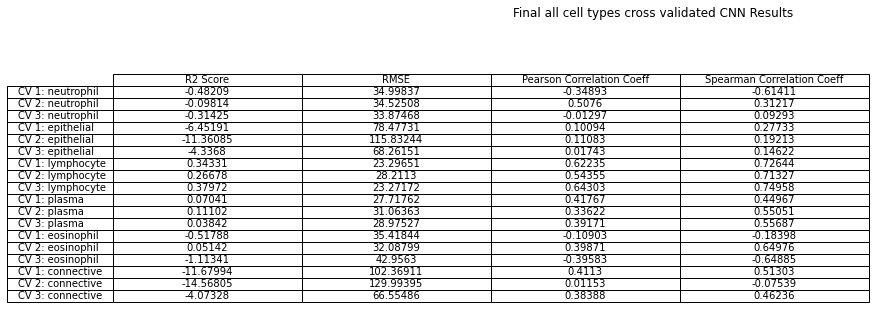

In [40]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(25,5))
fig.subplots_adjust(left=0.2,top=0.8, wspace=1)

tab= plt.subplot2grid((4,3), (0,0), colspan=2, rowspan=2)
tab.table(cellText=newdata,
          rowLabels=rows,
          cellLoc='center',
          colLabels=columns, loc="upper center")

tab.axis("off")
fig.suptitle('Final all cell types cross validated CNN Results')
plt.show()